## Name: wiwitthawin chareonngam

## ID: 6310501933     &emsp;&emsp;&emsp;  sec: 1

## Project 01205489-1st

-------------

# News Headlines Dataset For Sarcasm Detection

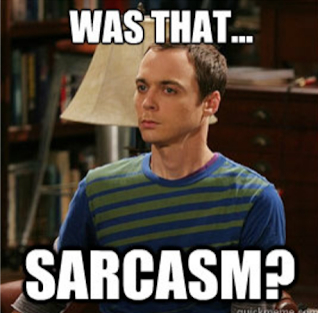

# Table of Content

[<h3>Code from Competition</h3>](#1)
[<h3>Description</h3>](#2)
[<h3>Import Libraries</h3>](#3)
[<h3>Visualize data</h3>](#4)
[<h3>Word Analysis</h3>](#5)
[<h3>Clean Data</h3>](#6)
[<h3>WorkCloud</h3>](#7)
[<h3>One word prediction-1</h3>](#8)
[<h3>Bag of Words Counts</h3>](#9)
[<h3>TF IDF (Term Frequency, Inverse Document Frequency)</h3>](#10)
[<h3>Training Model</h3>](#11)
[<h3>One word prediction-2</h3>](#12)
[<h3>Logistic Regression</h3>](#13)
[<h3>Decision Tree</h3>](#14)
[<h3>Random Forest</h3>](#15)
[<h3>Naive bayes</h3>](#16)
[<h3>Glove</h3>](#17)
[<h3>Train Glove</h3>](#18)
[<h3>Confusion Matrix</h3>](#19)
[<h3>Compare with others</h3>](#20)
[<h3>Summary</h3>](#21)
[<h3>Special: Glove; 50D 100D 200D 300D???</h3>](#22)
[<h3>Special: Why I use V1 and V2</h3>](#23)

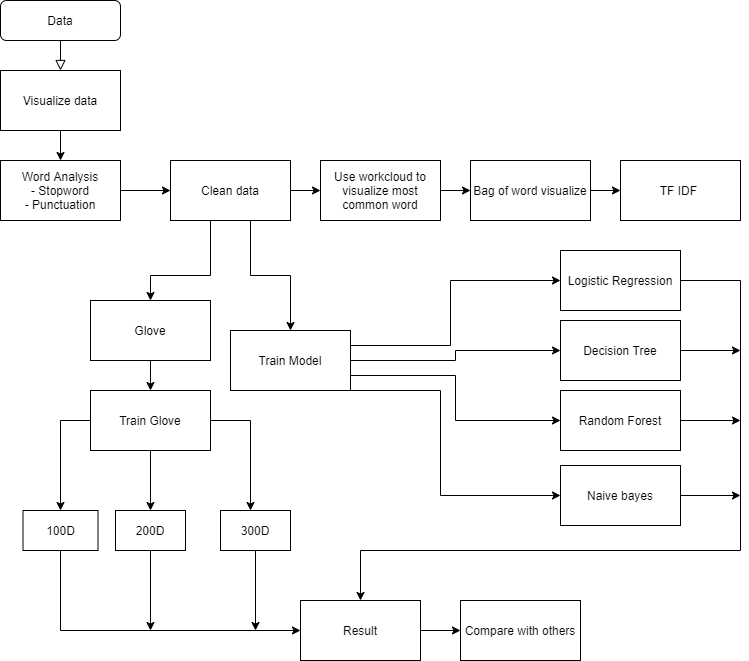

## Code from Competition<a class="anchor" id="1"></a>

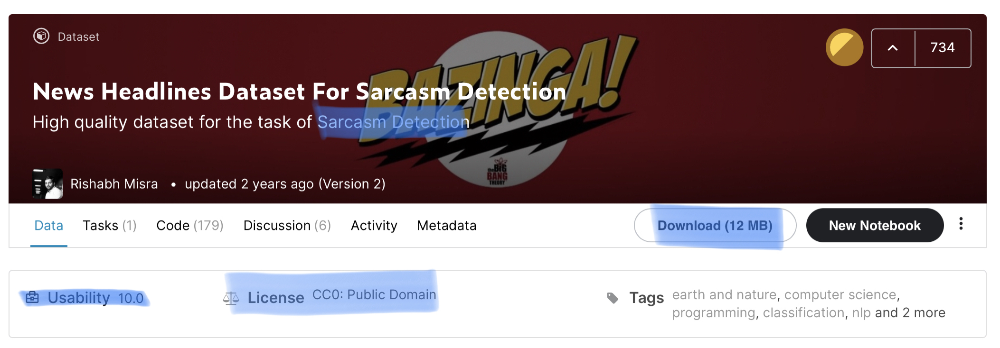

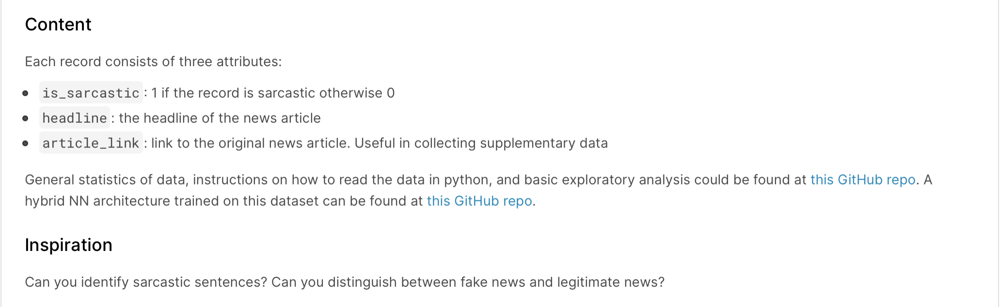

## Description<a class="anchor" id="2"></a>

### - Objection: classify headline of news whether it is sarcasm or not
### - Type of file: text in json
### - Type of problem: binary classification

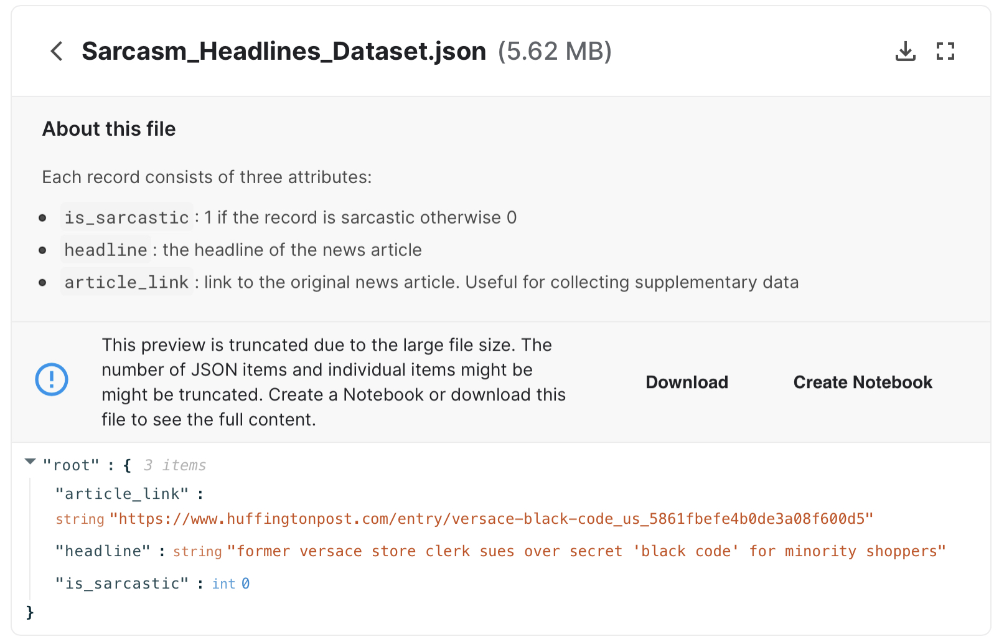

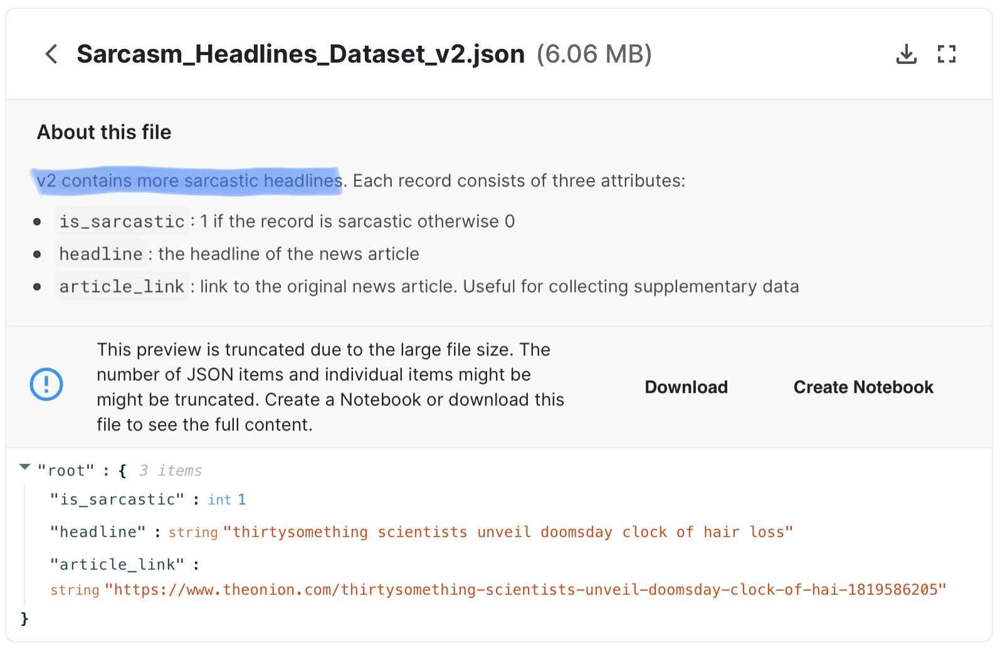

# Import Libraries<a class="anchor" id="3"></a>

In [131]:
%matplotlib inline
import pandas as pd
import numpy as np
import os
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

import nltk
#nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.util import ngrams

from wordcloud import WordCloud

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.metrics import classification_report,confusion_matrix

from collections import defaultdict
from collections import Counter
plt.style.use('ggplot')
stop=set(stopwords.words('english'))

import re
from nltk.tokenize import word_tokenize
import gensim
import string

from tqdm import tqdm
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, LSTM,Dense, SpatialDropout1D, Dropout
from keras.initializers import Constant
from tensorflow.keras.optimizers import Adam


import torch

import warnings
warnings.simplefilter('ignore')

#Deep learning libraries
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout

In [132]:
# same data?
import filecmp
filecmp.cmp('Sarcasm_Headlines_Dataset.json', 'Sarcasm_Headlines_Dataset_v2.json')

False

In [133]:
df1 = pd.read_json("Sarcasm_Headlines_Dataset.json", lines=True)
df1.head()

,article_link,headline,is_sarcastic
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues over secret 'b...,0
1,https://www.huffingtonpost.com/entry/roseanne-...,the 'roseanne' revival catches up to our thorn...,0
2,https://local.theonion.com/mom-starting-to-fea...,mom starting to fear son's web series closest ...,1
3,https://politics.theonion.com/boehner-just-wan...,"boehner just wants wife to listen, not come up...",1
4,https://www.huffingtonpost.com/entry/jk-rowlin...,j.k. rowling wishes snape happy birthday in th...,0


In [134]:
df2 = pd.read_json("Sarcasm_Headlines_Dataset_v2.json", lines=True)
df2.head()

,is_sarcastic,headline,article_link
0,1,thirtysomething scientists unveil doomsday clo...,https://www.theonion.com/thirtysomething-scien...
1,0,dem rep. totally nails why congress is falling...,https://www.huffingtonpost.com/entry/donna-edw...
2,0,eat your veggies: 9 deliciously different recipes,https://www.huffingtonpost.com/entry/eat-your-...
3,1,inclement weather prevents liar from getting t...,https://local.theonion.com/inclement-weather-p...
4,1,mother comes pretty close to using word 'strea...,https://www.theonion.com/mother-comes-pretty-c...


In [135]:
df1.describe()

,is_sarcastic
count,26709.000000
mean,0.438953
std,0.496269
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [136]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26709 entries, 0 to 26708
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   article_link  26709 non-null  object
 1   headline      26709 non-null  object
 2   is_sarcastic  26709 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 626.1+ KB


In [137]:
df2.describe()
#file 2 has slighly more data than df1

,is_sarcastic
count,28619.000000
mean,0.476397
std,0.499451
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [138]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28619 entries, 0 to 28618
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   is_sarcastic  28619 non-null  int64 
 1   headline      28619 non-null  object
 2   article_link  28619 non-null  object
dtypes: int64(1), object(2)
memory usage: 670.9+ KB


## **Compare df1 and df2

In [139]:
df1 = df1.reindex(columns=['article_link','headline','is_sarcastic','length'])
df2 = df2.reindex(columns=['article_link','headline','is_sarcastic','length'])

In [140]:
df1

,article_link,headline,is_sarcastic,length
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues over secret 'b...,0,NaN
1,https://www.huffingtonpost.com/entry/roseanne-...,the 'roseanne' revival catches up to our thorn...,0,NaN
2,https://local.theonion.com/mom-starting-to-fea...,mom starting to fear son's web series closest ...,1,NaN
3,https://politics.theonion.com/boehner-just-wan...,"boehner just wants wife to listen, not come up...",1,NaN
4,https://www.huffingtonpost.com/entry/jk-rowlin...,j.k. rowling wishes snape happy birthday in th...,0,NaN
...,...,...,...,...
26704,https://www.huffingtonpost.com/entry/american-...,american politics in moral free-fall,0,NaN
26705,https://www.huffingtonpost.com/entry/americas-...,america's best 20 hikes,0,NaN
26706,https://www.huffingtonpost.com/entry/reparatio...,reparations and obama,0,NaN
26707,https://www.huffingtonpost.com/entry/israeli-b...,israeli ban targeting boycott supporters raise...,0,NaN


In [141]:
df2

,article_link,headline,is_sarcastic,length
0,https://www.theonion.com/thirtysomething-scien...,thirtysomething scientists unveil doomsday clo...,1,NaN
1,https://www.huffingtonpost.com/entry/donna-edw...,dem rep. totally nails why congress is falling...,0,NaN
2,https://www.huffingtonpost.com/entry/eat-your-...,eat your veggies: 9 deliciously different recipes,0,NaN
3,https://local.theonion.com/inclement-weather-p...,inclement weather prevents liar from getting t...,1,NaN
4,https://www.theonion.com/mother-comes-pretty-c...,mother comes pretty close to using word 'strea...,1,NaN
...,...,...,...,...
28614,https://www.theonion.com/jews-to-celebrate-ros...,jews to celebrate rosh hashasha or something,1,NaN
28615,https://local.theonion.com/internal-affairs-in...,internal affairs investigator disappointed con...,1,NaN
28616,https://www.huffingtonpost.com/entry/andrew-ah...,the most beautiful acceptance speech this week...,0,NaN
28617,https://www.theonion.com/mars-probe-destroyed-...,mars probe destroyed by orbiting spielberg-gat...,1,NaN


In [142]:
df3 = df1.copy()
#set equal dimension
for i in range(len(df2)-len(df1)):
    df3.loc[len(df3)] = 0

In [143]:
df3

,article_link,headline,is_sarcastic,length
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues over secret 'b...,0,NaN
1,https://www.huffingtonpost.com/entry/roseanne-...,the 'roseanne' revival catches up to our thorn...,0,NaN
2,https://local.theonion.com/mom-starting-to-fea...,mom starting to fear son's web series closest ...,1,NaN
3,https://politics.theonion.com/boehner-just-wan...,"boehner just wants wife to listen, not come up...",1,NaN
4,https://www.huffingtonpost.com/entry/jk-rowlin...,j.k. rowling wishes snape happy birthday in th...,0,NaN
...,...,...,...,...
28614,0,0,0,0.0
28615,0,0,0,0.0
28616,0,0,0,0.0
28617,0,0,0,0.0


In [144]:
print((df2['headline'].str.lower().str.replace('s/+',"") == df3['headline'].str.strip().str.replace('s/+',"")).value_counts())

False    28619
Name: headline, dtype: int64


##### No duplicate data from df1 and df2 -> can concatenate

# Visualize data<a class="anchor" id="4"></a>

## Length of text

In [145]:
df1['length'] = df1['headline'].apply(len)
df2['length'] = df2['headline'].apply(len)

In [146]:
df1 = df1.reindex(columns=['article_link','headline','is_sarcastic','length'])
df1.head()

,article_link,headline,is_sarcastic,length
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues over secret 'b...,0,78
1,https://www.huffingtonpost.com/entry/roseanne-...,the 'roseanne' revival catches up to our thorn...,0,84
2,https://local.theonion.com/mom-starting-to-fea...,mom starting to fear son's web series closest ...,1,79
3,https://politics.theonion.com/boehner-just-wan...,"boehner just wants wife to listen, not come up...",1,84
4,https://www.huffingtonpost.com/entry/jk-rowlin...,j.k. rowling wishes snape happy birthday in th...,0,64


In [147]:
df2 = df2.reindex(columns=['article_link','headline','is_sarcastic','length'])
df2.head()

,article_link,headline,is_sarcastic,length
0,https://www.theonion.com/thirtysomething-scien...,thirtysomething scientists unveil doomsday clo...,1,61
1,https://www.huffingtonpost.com/entry/donna-edw...,dem rep. totally nails why congress is falling...,0,79
2,https://www.huffingtonpost.com/entry/eat-your-...,eat your veggies: 9 deliciously different recipes,0,49
3,https://local.theonion.com/inclement-weather-p...,inclement weather prevents liar from getting t...,1,52
4,https://www.theonion.com/mother-comes-pretty-c...,mother comes pretty close to using word 'strea...,1,61


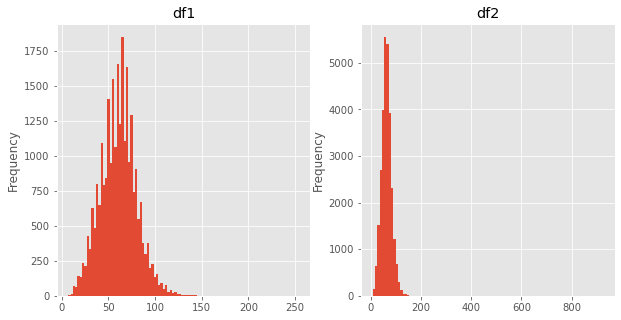

In [148]:
fig, axes = plt.subplots(nrows=1, ncols=2)
ax = df1['length'].plot(bins=100, kind='hist',ax=axes[0],figsize=(10,5),title='df1')
ax = df2['length'].plot(bins=100, kind='hist',ax=axes[1],figsize=(10,5),title='df2') 

(0.0, 6000.0)

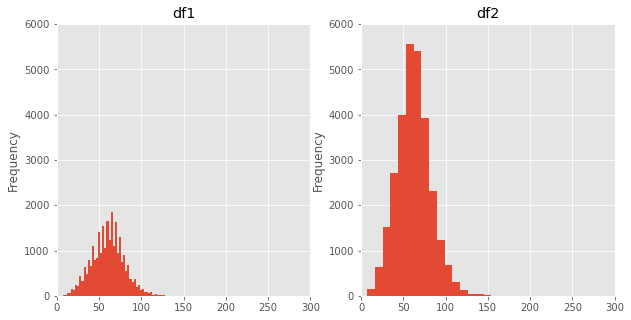

In [149]:
#df1['length'].plot(bins=100, kind='hist')
fig, axes = plt.subplots(nrows=1, ncols=2)
ax = df1['length'].plot(bins=100, kind='hist',ax=axes[0],figsize=(10,5),title='df1')
ax.set_xlim(0, 300)
ax.set_ylim(0, 6000)
ax = df2['length'].plot(bins=100, kind='hist',ax=axes[1],figsize=(10,5),title='df2') 
ax.set_xlim(0, 300)
ax.set_ylim(0, 6000)

In [150]:
df1.describe()

,is_sarcastic,length
count,26709.000000,26709.000000
mean,0.438953,60.910592
std,0.496269,19.184470
min,0.000000,7.000000
25%,0.000000,48.000000
50%,0.000000,61.000000
75%,1.000000,73.000000
max,1.000000,254.000000


In [151]:
df2.describe()

,is_sarcastic,length
count,28619.000000,28619.000000
mean,0.476397,62.308571
std,0.499451,20.726483
min,0.000000,7.000000
25%,0.000000,49.000000
50%,0.000000,62.000000
75%,1.000000,75.000000
max,1.000000,926.000000


In [152]:
df1.loc[df1['length'].argmax()]['headline']

'maya angelou, poet, author, civil rights activist, and—holy cow—tony award–nominated actress, college professor, magazine editor, streetcar conductor—really? streetcar conductor? wow—calypso singer, nightclub performer, and foreign journalist, dead at 86'

In [153]:
df2.loc[df2['length'].argmax()]['headline']

'hot wheels ranked number one toy for rolling down ramp, knocking over dominoes that send marble down a funnel, dropping onto teeter-totter that yanks on string, causing pulley system to raise wooden block, propelling series of twine rollers that unwind spring, launching tennis ball across room, inching tire down slope until it hits power switch, activating table fan that blows toy ship with nail attached to it across kiddie pool, popping water balloon that fills cup, weighing down lever that forces basketball down track, nudging broomstick on axis to rotate, allowing golf ball to roll into sideways coffee mug, which tumbles down row of hardcover books until handle catches hook attached to lever that causes wooden mallet to slam down on serving spoon, catapulting small ball into cup attached by ribbon to lazy susan, which spins until it pushes d battery down incline plane, tipping over salt shaker to season omelet'

## *Combine both data

In [154]:
df1

,article_link,headline,is_sarcastic,length
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues over secret 'b...,0,78
1,https://www.huffingtonpost.com/entry/roseanne-...,the 'roseanne' revival catches up to our thorn...,0,84
2,https://local.theonion.com/mom-starting-to-fea...,mom starting to fear son's web series closest ...,1,79
3,https://politics.theonion.com/boehner-just-wan...,"boehner just wants wife to listen, not come up...",1,84
4,https://www.huffingtonpost.com/entry/jk-rowlin...,j.k. rowling wishes snape happy birthday in th...,0,64
...,...,...,...,...
26704,https://www.huffingtonpost.com/entry/american-...,american politics in moral free-fall,0,36
26705,https://www.huffingtonpost.com/entry/americas-...,america's best 20 hikes,0,23
26706,https://www.huffingtonpost.com/entry/reparatio...,reparations and obama,0,21
26707,https://www.huffingtonpost.com/entry/israeli-b...,israeli ban targeting boycott supporters raise...,0,60


In [155]:
df2

,article_link,headline,is_sarcastic,length
0,https://www.theonion.com/thirtysomething-scien...,thirtysomething scientists unveil doomsday clo...,1,61
1,https://www.huffingtonpost.com/entry/donna-edw...,dem rep. totally nails why congress is falling...,0,79
2,https://www.huffingtonpost.com/entry/eat-your-...,eat your veggies: 9 deliciously different recipes,0,49
3,https://local.theonion.com/inclement-weather-p...,inclement weather prevents liar from getting t...,1,52
4,https://www.theonion.com/mother-comes-pretty-c...,mother comes pretty close to using word 'strea...,1,61
...,...,...,...,...
28614,https://www.theonion.com/jews-to-celebrate-ros...,jews to celebrate rosh hashasha or something,1,44
28615,https://local.theonion.com/internal-affairs-in...,internal affairs investigator disappointed con...,1,87
28616,https://www.huffingtonpost.com/entry/andrew-ah...,the most beautiful acceptance speech this week...,0,71
28617,https://www.theonion.com/mars-probe-destroyed-...,mars probe destroyed by orbiting spielberg-gat...,1,61


In [156]:
df2 = pd.concat([df1, df2])

In [157]:
df2

,article_link,headline,is_sarcastic,length
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues over secret 'b...,0,78
1,https://www.huffingtonpost.com/entry/roseanne-...,the 'roseanne' revival catches up to our thorn...,0,84
2,https://local.theonion.com/mom-starting-to-fea...,mom starting to fear son's web series closest ...,1,79
3,https://politics.theonion.com/boehner-just-wan...,"boehner just wants wife to listen, not come up...",1,84
4,https://www.huffingtonpost.com/entry/jk-rowlin...,j.k. rowling wishes snape happy birthday in th...,0,64
...,...,...,...,...
28614,https://www.theonion.com/jews-to-celebrate-ros...,jews to celebrate rosh hashasha or something,1,44
28615,https://local.theonion.com/internal-affairs-in...,internal affairs investigator disappointed con...,1,87
28616,https://www.huffingtonpost.com/entry/andrew-ah...,the most beautiful acceptance speech this week...,0,71
28617,https://www.theonion.com/mars-probe-destroyed-...,mars probe destroyed by orbiting spielberg-gat...,1,61


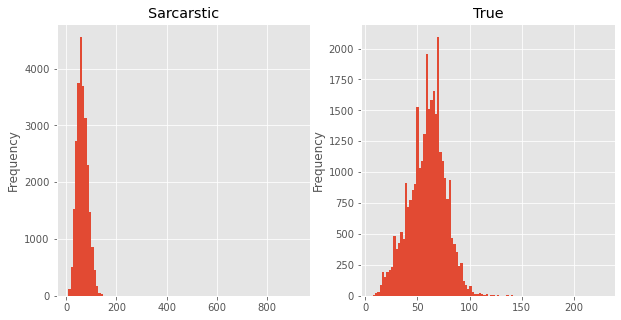

In [159]:
fig, axes = plt.subplots(nrows=1, ncols=2)
df2_1, df2_2 = df2.loc[df2['is_sarcastic'] == 1] ,df2.loc[df2['is_sarcastic'] == 0]
ax = df2_1['length'].plot(bins=100, kind='hist',ax=axes[0],figsize=(10,5),title='Sarcarstic') 
ax = df2_2['length'].plot(bins=100, kind='hist',ax=axes[1],figsize=(10,5),title='True') 

(0.0, 5000.0)

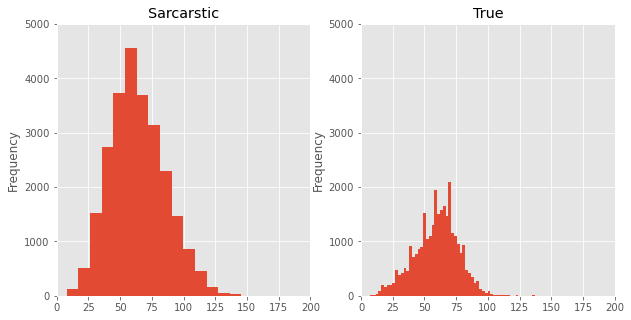

In [160]:
fig, axes = plt.subplots(nrows=1, ncols=2)
ax = df2_1['length'].plot(bins=100, kind='hist',ax=axes[0],figsize=(10,5),title='Sarcarstic')
ax.set_xlim(0, 200)
ax.set_ylim(0, 5000)
ax = df2_2['length'].plot(bins=100, kind='hist',ax=axes[1],figsize=(10,5),title='True') 
ax.set_xlim(0, 200)
ax.set_ylim(0, 5000)

In [161]:
df2_1

,article_link,headline,is_sarcastic,length
2,https://local.theonion.com/mom-starting-to-fea...,mom starting to fear son's web series closest ...,1,79
3,https://politics.theonion.com/boehner-just-wan...,"boehner just wants wife to listen, not come up...",1,84
8,https://politics.theonion.com/top-snake-handle...,top snake handler leaves sinking huckabee camp...,1,50
15,https://entertainment.theonion.com/nuclear-bom...,nuclear bomb detonates during rehearsal for 's...,1,64
16,https://www.theonion.com/cosby-lawyer-asks-why...,cosby lawyer asks why accusers didn't come for...,1,88
...,...,...,...,...
28612,https://entertainment.theonion.com/polish-rapp...,polish rapper under fire for use of the word '...,1,53
28614,https://www.theonion.com/jews-to-celebrate-ros...,jews to celebrate rosh hashasha or something,1,44
28615,https://local.theonion.com/internal-affairs-in...,internal affairs investigator disappointed con...,1,87
28617,https://www.theonion.com/mars-probe-destroyed-...,mars probe destroyed by orbiting spielberg-gat...,1,61


In [162]:
df2_2

,article_link,headline,is_sarcastic,length
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues over secret 'b...,0,78
1,https://www.huffingtonpost.com/entry/roseanne-...,the 'roseanne' revival catches up to our thorn...,0,84
4,https://www.huffingtonpost.com/entry/jk-rowlin...,j.k. rowling wishes snape happy birthday in th...,0,64
5,https://www.huffingtonpost.com/entry/advancing...,advancing the world's women,0,27
6,https://www.huffingtonpost.com/entry/how-meat-...,the fascinating case for eating lab-grown meat,0,46
...,...,...,...,...
28607,https://www.huffingtonpost.com/entry/what-our-...,what our grieving family needs from loved ones...,0,66
28608,https://www.huffingtonpost.com/entry/stephen-c...,stephen colbert attempts to list everything tr...,0,80
28609,https://www.huffingtonpost.com/entry/jack-phil...,bakery owner vows to stop making wedding cakes...,0,84
28613,https://www.huffingtonpost.com/entry/san-anton...,how san antonio's dominant defense is fueling ...,0,57


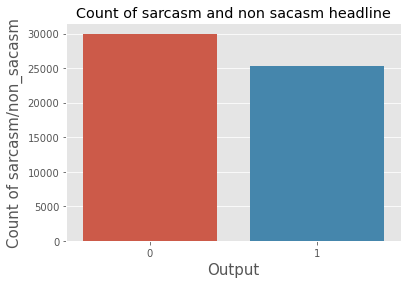

In [158]:
ax=sns.countplot(x="is_sarcastic", data=df2)

ax.set(xlabel='Output', ylabel='Count of sarcasm/non_sacasm',title='Count of sarcasm and non sacasm headline')
ax.xaxis.get_label().set_fontsize(15)
ax.yaxis.get_label().set_fontsize(15)

In [163]:
print( 'Sarcastic Headline percentage =', (len(df2_1) / (len(df2_1)+len(df2_2)) )*100,"%")
print( 'Non Sarcastic Headline percentage =', (len(df2_2) / (len(df2_1)+len(df2_2)) )*100,"%")

Sarcastic Headline percentage = 45.83212839791787 %
Non Sarcastic Headline percentage = 54.16787160208213 %


# Word Analysis<a class="anchor" id="5"></a>

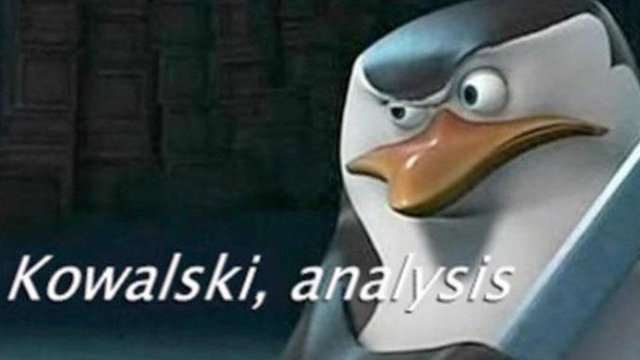

### *Number of character

In [164]:
df2_1.describe()

,is_sarcastic,length
count,25358.0,25358.000000
mean,1.0,64.086206
std,0.0,22.537987
min,1.0,8.000000
25%,1.0,48.000000
50%,1.0,62.000000
75%,1.0,78.000000
max,1.0,926.000000


In [165]:
df2_2.describe()

,is_sarcastic,length
count,29970.0,29970.000000
mean,0.0,59.558625
std,0.0,17.318587
min,0.0,7.000000
25%,0.0,48.000000
50%,0.0,61.000000
75%,0.0,71.000000
max,0.0,228.000000


In [166]:
df2_1['headline'].str.len().sum()

1625098

In [167]:
df2_2['headline'].str.len().sum()

1784972

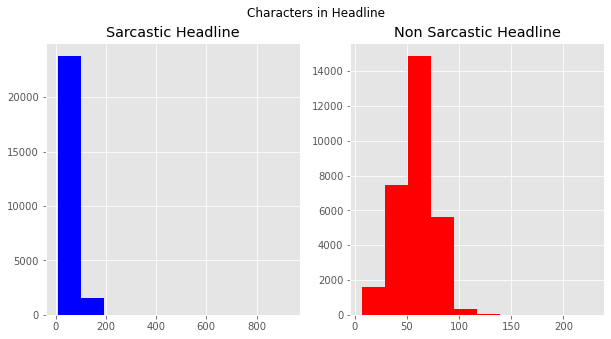

In [168]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
tweet_len=df2_1['headline'].str.len()
ax1.hist(tweet_len,color='blue')
ax1.set_title('Sarcastic Headline')
#ax1.set_xlim(0, 200)
#ax1.set_ylim(0, 14000)

tweet_len=df2_2['headline'].str.len()
ax2.hist(tweet_len,color='red')
ax2.set_title('Non Sarcastic Headline')
#ax2.set_xlim(0, 200)
#ax2.set_ylim(0, 14000)
fig.suptitle('Characters in Headline')
plt.show()

### Number of word

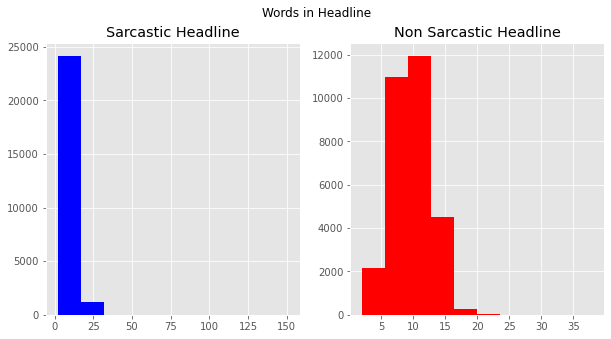

In [169]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
tweet_len=df2_1['headline'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='blue')
ax1.set_title('Sarcastic Headline')
tweet_len=df2_2['headline'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='red')
ax2.set_title('Non Sarcastic Headline')
fig.suptitle('Words in Headline')
plt.show()

Text(0.5, 0.98, 'Average word length in Headline')

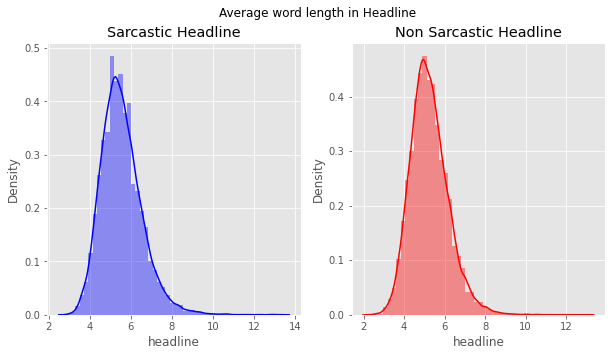

In [170]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
word=df2_1['headline'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='blue')
ax1.set_title('Sarcastic Headline')
word=df2_2['headline'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='red')
ax2.set_title('Non Sarcastic Headline')
fig.suptitle('Average word length in Headline')

#Average word length graph will decide whether to use dataset or not(if both of them is not significantly different)

# Clean Data<a class="anchor" id="6"></a>

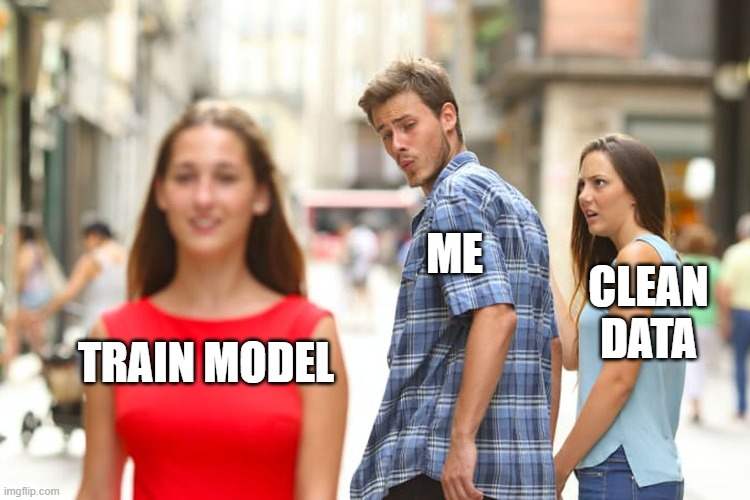

## Text Processing

In [171]:
def create_corpus(label):
    corpus=[]
    
    for x in df2[df2['is_sarcastic']==label]['headline'].str.split():
        for i in x:
            corpus.append(i)
    return corpus

def create_corpus_df(df2, label):
    corpus=[]
    
    for x in df2[df2['is_sarcastic']==label]['headline'].str.split():
        for i in x:
            corpus.append(i)
    return corpus
#function to split word into corpus(tokenize)

## Stopword

### Sarcastic Headline

In [172]:
corpus=create_corpus(1)

dic=defaultdict(int)
for word in corpus:
    if word in stop:
        dic[word]+=1
        
top=sorted(dic.items(), key=lambda x:x[1],reverse=True)[:10]

np.array(stop)
#common stopword of sarcastic headline

array({'again', 'up', "wouldn't", 'being', 'why', "hasn't", "mightn't", 'am', 'myself', "you've", 'wasn', 'below', 'then', 'hers', 'theirs', 'with', 'during', 'you', 'both', "should've", 'these', 'the', 'all', 'll', 'further', 'couldn', 'few', "shouldn't", "you'll", 'into', "didn't", 'off', 'hasn', 'at', 'there', 'yourself', 'most', "shan't", 'once', 'they', 'after', 'it', "it's", 'are', 'we', 'and', 'yours', 'didn', 'them', 'down', 'its', 'is', 't', 'that', 'yourselves', 'until', 'd', 'on', 'own', 'doing', 'who', 'above', 'he', 'not', 'was', "doesn't", 'under', 'has', 'haven', 'very', 'be', 'out', "you'd", 'against', 'where', 'she', 'of', 'i', "she's", 'those', 'did', 'here', 'than', "needn't", 'nor', 're', 'if', 'shan', 'hadn', 'isn', 'been', 'o', 'doesn', 'so', 'itself', 'too', 'for', 'aren', 'weren', "wasn't", 'ma', "haven't", 'wouldn', 'just', 'y', 'other', "you're", 'this', 'does', 'or', 'mustn', 's', 'through', "don't", 'more', 'because', 'when', 'such', 'your', 'ourselves', 'ca

In [173]:
top

[('to', 9121),
 ('of', 6921),
 ('in', 3857),
 ('for', 3152),
 ('on', 2339),
 ('with', 1862),
 ('by', 1310),
 ('the', 1272),
 ('from', 1224),
 ('at', 1218)]

<BarContainer object of 10 artists>

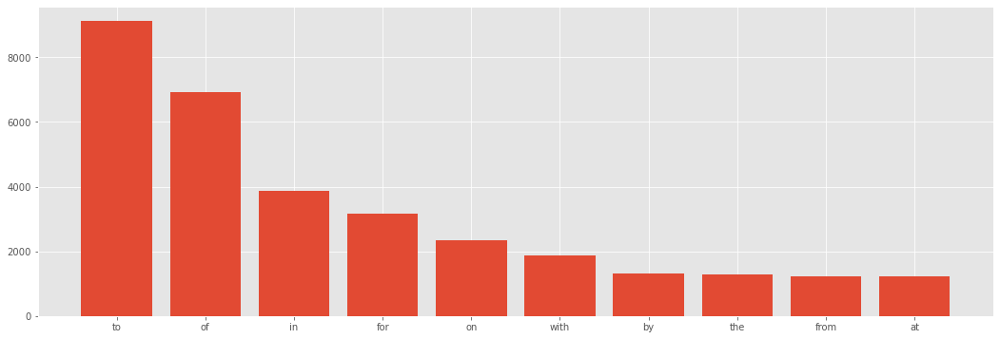

In [174]:
plt.rcParams['figure.figsize'] = (18.0, 6.0)
x,y=zip(*top)
plt.bar(x,y)

### Non Sarcastic Headline

<BarContainer object of 10 artists>

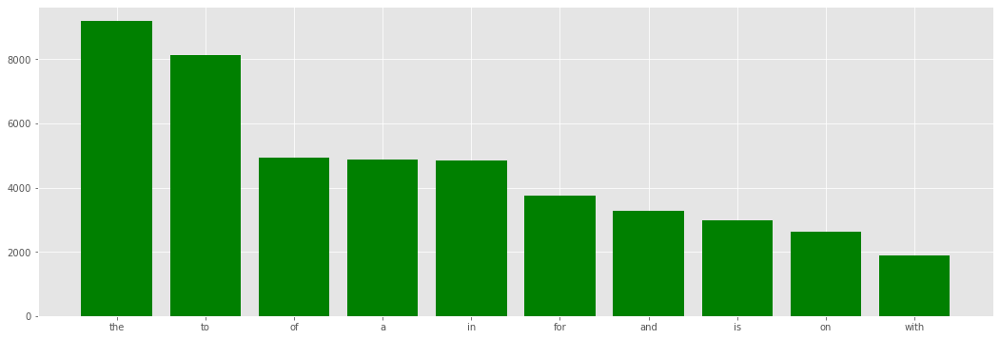

In [175]:
corpus=create_corpus(0)

dic=defaultdict(int)
for word in corpus:
    if word in stop:
        dic[word]+=1

top=sorted(dic.items(), key=lambda x:x[1],reverse=True)[:10] 
    

plt.rcParams['figure.figsize'] = (18.0, 6.0)
x,y=zip(*top)
plt.bar(x,y, color = 'green')
#common stopword of Non sarcastic headline

In [176]:
stop = stopwords.words('english')
df2['headline'] = df2['headline'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
df2.head()
#remove stopword

,article_link,headline,is_sarcastic,length
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues secret 'black ...,0,78
1,https://www.huffingtonpost.com/entry/roseanne-...,'roseanne' revival catches thorny political mo...,0,84
2,https://local.theonion.com/mom-starting-to-fea...,mom starting fear son's web series closest thi...,1,79
3,https://politics.theonion.com/boehner-just-wan...,"boehner wants wife listen, come alternative de...",1,84
4,https://www.huffingtonpost.com/entry/jk-rowlin...,j.k. rowling wishes snape happy birthday magic...,0,64


## Punctuation

### Sarcastic Headline

<BarContainer object of 3 artists>

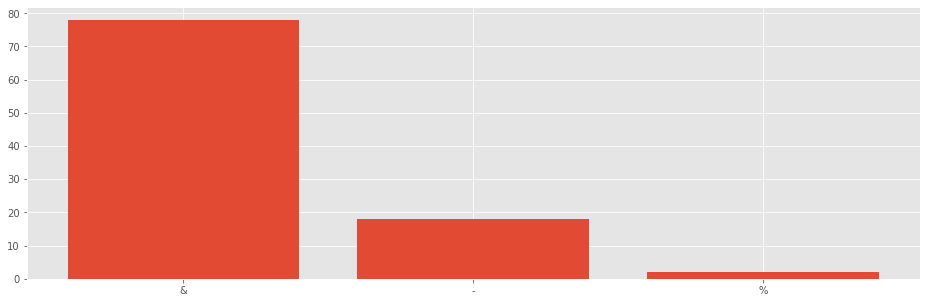

In [177]:
plt.figure(figsize=(16,5))
corpus=create_corpus(1)

dic=defaultdict(int)
special = string.punctuation
for i in (corpus):
    if i in special:
        dic[i]+=1
        
x,y=zip(*dic.items())
plt.bar(x,y)
#common punctuation of sarcastic headline

### Non Sarcastic Headline

<BarContainer object of 8 artists>

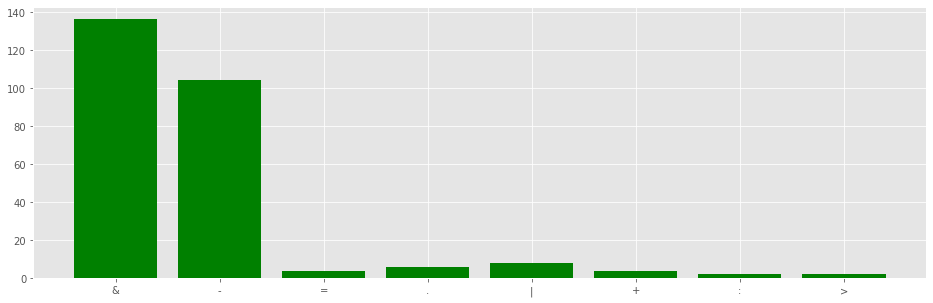

In [178]:
plt.figure(figsize=(16,5))
corpus=create_corpus(0)

dic=defaultdict(int)
special = string.punctuation
for i in (corpus):
    if i in special:
        dic[i]+=1
        
x,y=zip(*dic.items())
plt.bar(x,y, color='green')
#common punctuation of Non sarcastic headline

In [179]:
def remove_punct(text):
    table=str.maketrans('','',string.punctuation)
    return text.translate(table)

df2['headline']=df2['headline'].apply(lambda x : remove_punct(x))
df2
#remove punctuation

,article_link,headline,is_sarcastic,length
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues secret black c...,0,78
1,https://www.huffingtonpost.com/entry/roseanne-...,roseanne revival catches thorny political mood...,0,84
2,https://local.theonion.com/mom-starting-to-fea...,mom starting fear sons web series closest thin...,1,79
3,https://politics.theonion.com/boehner-just-wan...,boehner wants wife listen come alternative deb...,1,84
4,https://www.huffingtonpost.com/entry/jk-rowlin...,jk rowling wishes snape happy birthday magical...,0,64
...,...,...,...,...
28614,https://www.theonion.com/jews-to-celebrate-ros...,jews celebrate rosh hashasha something,1,44
28615,https://local.theonion.com/internal-affairs-in...,internal affairs investigator disappointed con...,1,87
28616,https://www.huffingtonpost.com/entry/andrew-ah...,beautiful acceptance speech week came queer ko...,0,71
28617,https://www.theonion.com/mars-probe-destroyed-...,mars probe destroyed orbiting spielberggates s...,1,61


## Common words

## Sarcastic Headline

<AxesSubplot:>

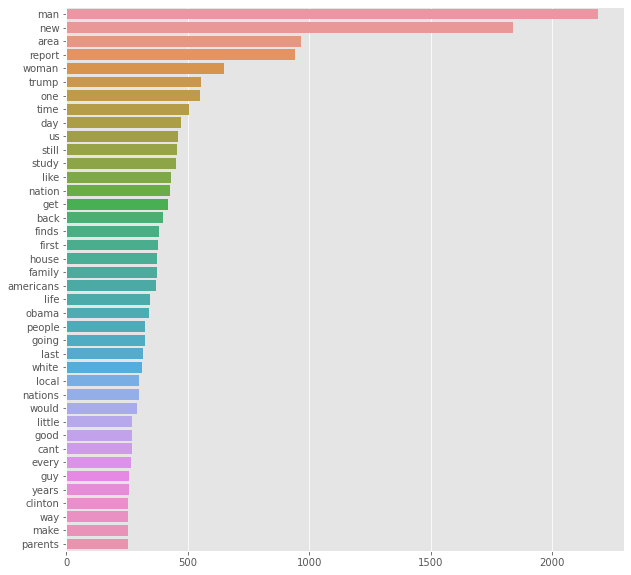

In [193]:
plt.figure(figsize=(10,10))
corpus=create_corpus(1)
counter=Counter(corpus)
most=counter.most_common()
x=[]
y=[]
for word,count in most[:40]:
    if (word not in stop) :
        x.append(word)
        y.append(count)

sns.barplot(x=y,y=x)
#common word of sarcastic headline

## Non Sarcastic Headline

<AxesSubplot:>

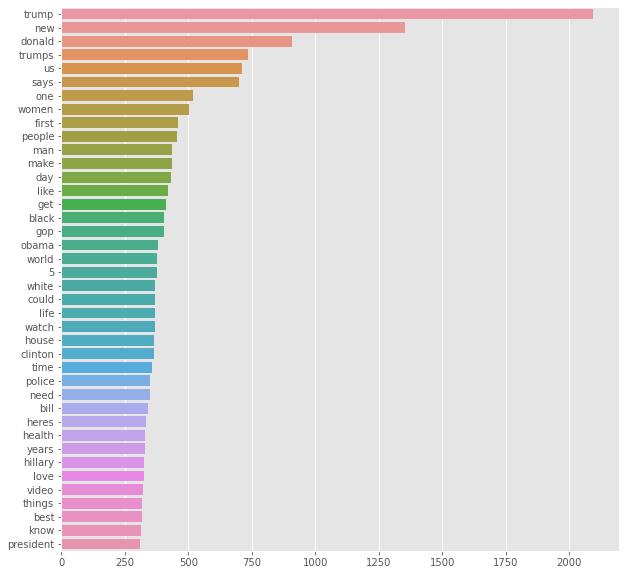

In [181]:
plt.figure(figsize=(10,10))
corpus=create_corpus(0)
counter=Counter(corpus)
most=counter.most_common()
x=[]
y=[]
for word,count in most[:40]:
    if (word not in stop) :
        x.append(word)
        y.append(count)

sns.barplot(x=y,y=x)
#common word of Non sarcastic headline

## N-gram analysis

In [182]:
def get_top_tweet_bigrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

def get_top_tweet_trigrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

def get_top_tweet_fourgrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(4, 4)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

<AxesSubplot:>

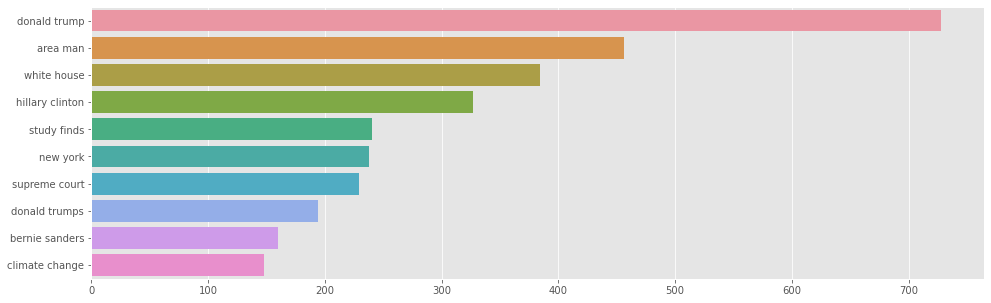

In [183]:
plt.figure(figsize=(16,5))
top_headline_bigrams=get_top_tweet_bigrams(df2['headline'])[:10]
x,y=map(list,zip(*top_headline_bigrams))
sns.barplot(x=y,y=x)

<AxesSubplot:>

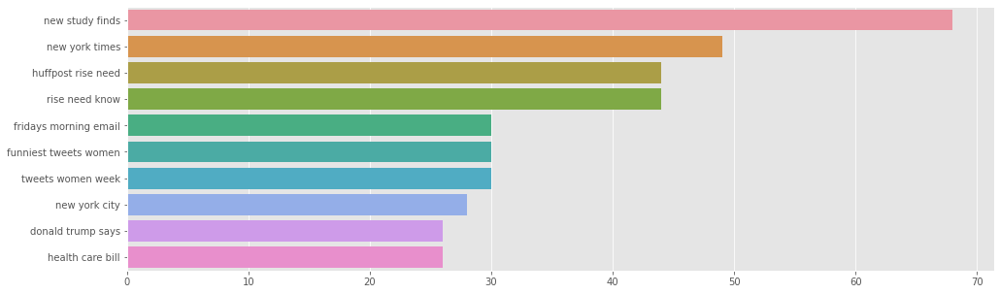

In [184]:
plt.figure(figsize=(16,5))
top_headline_trigrams=get_top_tweet_trigrams(df2['headline'])[:10]
x,y=map(list,zip(*top_headline_trigrams))
sns.barplot(x=y,y=x)

<AxesSubplot:>

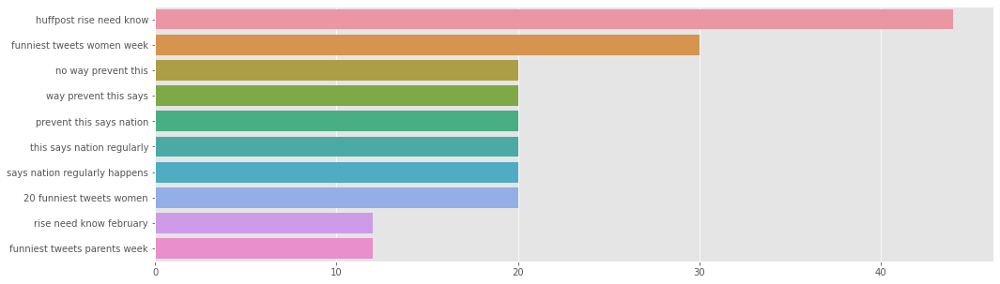

In [185]:
plt.figure(figsize=(16,5))
top_headline_fourgrams=get_top_tweet_fourgrams(df2['headline'])[:10]
x,y=map(list,zip(*top_headline_fourgrams))
sns.barplot(x=y,y=x)

## URL

In [186]:
df3 = pd.read_json("Sarcasm_Headlines_Dataset_v2.json", lines=True)

df3 = df3.loc[df3['is_sarcastic']==1]
df3['article_link']

0        https://www.theonion.com/thirtysomething-scien...
3        https://local.theonion.com/inclement-weather-p...
4        https://www.theonion.com/mother-comes-pretty-c...
7        https://www.theonion.com/richard-bransons-glob...
8        https://politics.theonion.com/shadow-governmen...
                               ...                        
28612    https://entertainment.theonion.com/polish-rapp...
28614    https://www.theonion.com/jews-to-celebrate-ros...
28615    https://local.theonion.com/internal-affairs-in...
28617    https://www.theonion.com/mars-probe-destroyed-...
28618    https://www.theonion.com/dad-clarifies-this-no...
Name: article_link, Length: 13634, dtype: object

In [187]:
def remove_URL(text):
    #url = re.compile(r'https?://\S+|www\.\S+')
    url = re.compile(r'www.')
    url = re.compile(r'.com')
    return url.sub(r'',text)

df3['article_link']=df3['article_link'].apply(lambda x : remove_URL(x))

def remove_url(old_url):
    url = old_url.rsplit('/', 2)[1]
    #url = re.search('www.(.*).com', url).group(1)
    return url

df3['article_link']=df3['article_link'].apply(lambda x : remove_url(x))
df3['article_link']

0                  www.theonion
3                local.theonion
4                  www.theonion
7                  www.theonion
8             politics.theonion
                  ...          
28612    entertainment.theonion
28614              www.theonion
28615            local.theonion
28617              www.theonion
28618              www.theonion
Name: article_link, Length: 13634, dtype: object

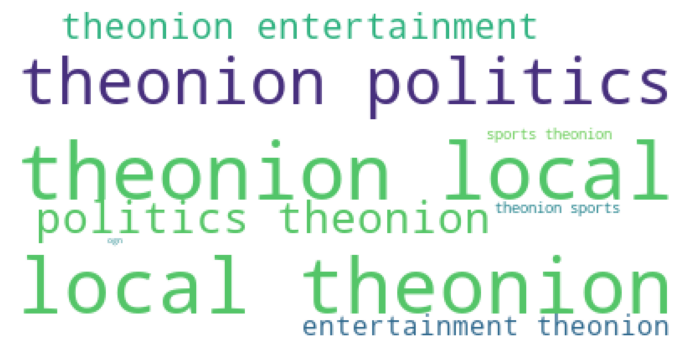

In [188]:
#plt.bar(df3['article_link'])

plt.figure(figsize=(12,22))
word_cloud = WordCloud(background_color='white',max_font_size = 80).generate(" ".join(df3['article_link']))
plt.imshow(word_cloud)
plt.axis('off')
plt.show()
#website relate to sarcastic news headline

# WorkCloud<a class="anchor" id="7"></a>

## Sarcastic Headline

In [189]:
Sarcastic_workcloud = create_corpus_df(df2,1)
len(Sarcastic_workcloud)

192957

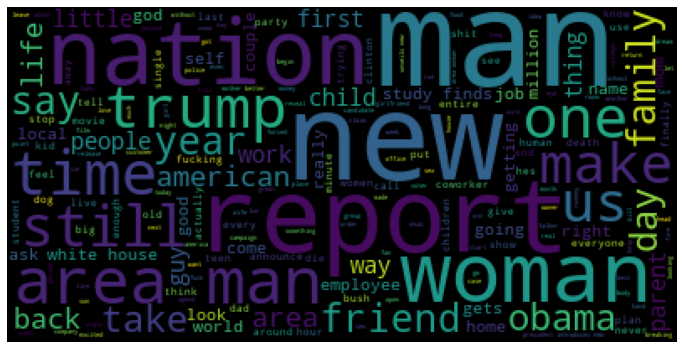

In [190]:
plt.figure(figsize=(12,8))
word_cloud = WordCloud(background_color='black',max_font_size = 80).generate(" ".join(Sarcastic_workcloud))
plt.imshow(word_cloud)
plt.axis('off')
plt.show()

## Non Sarcastic Headline

In [191]:
NonSarcastic_workcloud = create_corpus_df(df2,0)
len(NonSarcastic_workcloud)

206348

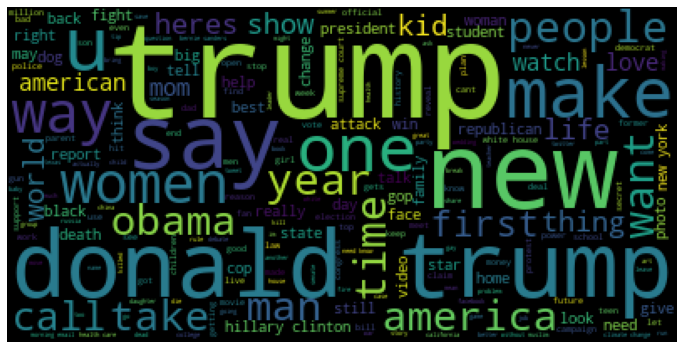

In [192]:
plt.figure(figsize=(12,8))
word_cloud = WordCloud(background_color='black',max_font_size = 80).generate(" ".join(NonSarcastic_workcloud))
plt.imshow(word_cloud)
plt.axis('off')
plt.show()

# One word prediction-1<a class="anchor" id="8"></a>

In [213]:
corpus_sarcastic=create_corpus(1)
counter=Counter(corpus_sarcastic)
most=counter.most_common()
x_s=[]
y_s=[]
for word,count in most[:50]:
    if (word not in stop) :
        x_s.append(word)
        y_s.append(count)

In [214]:
corpus_nonsarcastic=create_corpus(0)
counter=Counter(corpus_nonsarcastic)
most=counter.most_common()
x_ns=[]
y_ns=[]
for word,count in most[:50]:
    if (word not in stop) :
        x_ns.append(word)
        y_ns.append(count)

In [215]:
x_s

['man',
 'new',
 'area',
 'report',
 'woman',
 'trump',
 'one',
 'time',
 'day',
 'us',
 'still',
 'study',
 'like',
 'nation',
 'get',
 'back',
 'finds',
 'first',
 'house',
 'family',
 'americans',
 'life',
 'obama',
 'people',
 'going',
 'last',
 'white',
 'local',
 'nations',
 'would',
 'little',
 'good',
 'cant',
 'every',
 'guy',
 'years',
 'clinton',
 'way',
 'make',
 'parents',
 'home',
 'work',
 'says',
 'school',
 'mom',
 'getting',
 'really',
 'child',
 'hes',
 'mans']

In [216]:
x_ns

['trump',
 'new',
 'donald',
 'trumps',
 'us',
 'says',
 'one',
 'women',
 'first',
 'people',
 'man',
 'make',
 'day',
 'like',
 'get',
 'black',
 'gop',
 'obama',
 'world',
 '5',
 'white',
 'could',
 'life',
 'watch',
 'house',
 'clinton',
 'time',
 'police',
 'need',
 'bill',
 'heres',
 'health',
 'years',
 'hillary',
 'love',
 'video',
 'things',
 'best',
 'know',
 'president',
 'kids',
 'say',
 'woman',
 'may',
 'way',
 'show',
 'change',
 '10',
 'america']

In [217]:
x_all = set(x_s) - set(x_ns)
x_all
#sarcastic most common word without non sarcastic word

{'americans',
 'area',
 'back',
 'cant',
 'child',
 'every',
 'family',
 'finds',
 'getting',
 'going',
 'good',
 'guy',
 'hes',
 'home',
 'last',
 'little',
 'local',
 'mans',
 'mom',
 'nation',
 'nations',
 'parents',
 'really',
 'report',
 'school',
 'still',
 'study',
 'work',
 'would'}

# Bag of Words Counts<a class="anchor" id="9"></a>

Credit for: https://github.com/hundredblocks/concrete_NLP_tutorial/blob/master/NLP_notebook.ipynb

In [219]:
def cv(data):
    count_vectorizer = CountVectorizer()

    emb = count_vectorizer.fit_transform(data)

    return emb, count_vectorizer

list_corpus = df2["headline"].tolist()
list_labels = df2["is_sarcastic"].tolist()

X_train, X_test, y_train, y_test = train_test_split(list_corpus, list_labels,test_size=0.2,random_state=42)

X_train_counts, count_vectorizer = cv(X_train)
X_test_counts = count_vectorizer.transform(X_test)

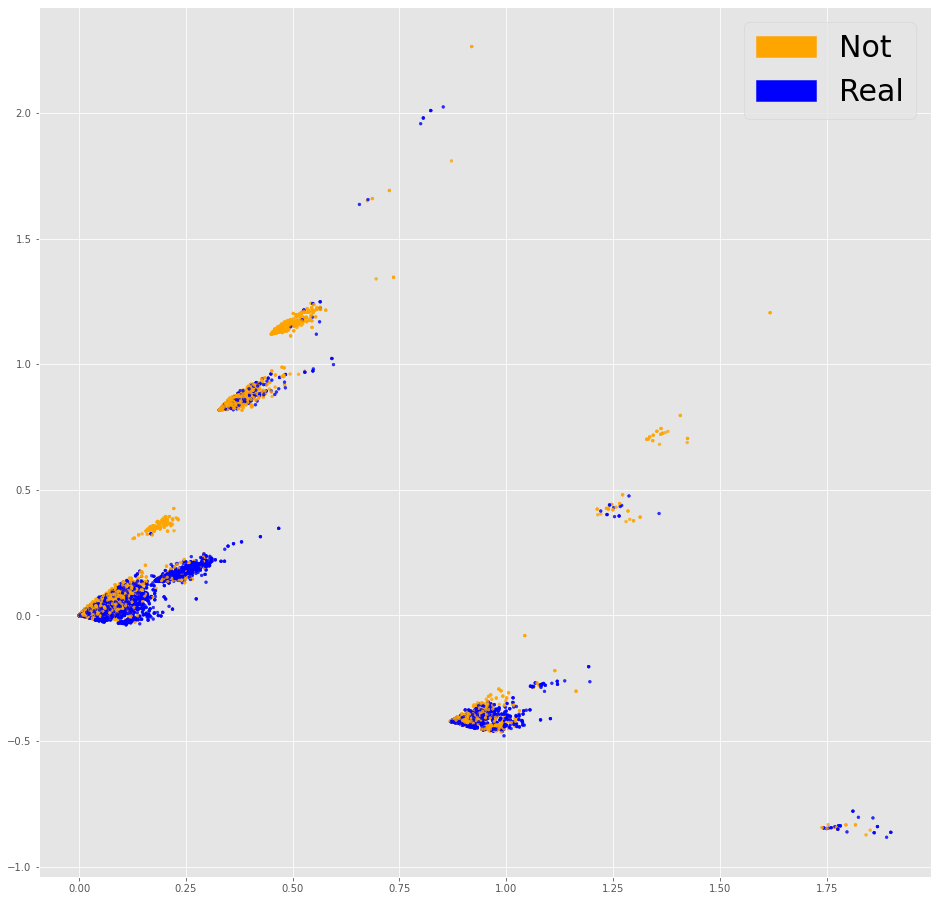

In [220]:
def plot_LSA(test_data, test_labels, savepath="PCA_demo.csv", plot=True):
        lsa = TruncatedSVD(n_components=2)
        lsa.fit(test_data)
        lsa_scores = lsa.transform(test_data)
        color_mapper = {label:idx for idx,label in enumerate(set(test_labels))}
        color_column = [color_mapper[label] for label in test_labels]
        colors = ['orange','blue']
        if plot:
            plt.scatter(lsa_scores[:,0], lsa_scores[:,1], s=8, alpha=.8, c=test_labels, cmap=matplotlib.colors.ListedColormap(colors))
            orange_patch = mpatches.Patch(color='orange', label='Not')
            blue_patch = mpatches.Patch(color='blue', label='Real')
            plt.legend(handles=[orange_patch, blue_patch], prop={'size': 30})

fig = plt.figure(figsize=(16, 16))          
plot_LSA(X_train_counts, y_train)
plt.show()

#Project data in 2D and see if they are separate or not

# TF IDF (Term Frequency, Inverse Document Frequency)<a class="anchor" id="10"></a>

In [221]:
def tfidf(data):
    tfidf_vectorizer = TfidfVectorizer()
    train = tfidf_vectorizer.fit_transform(data)
    return train, tfidf_vectorizer

X_train_tfidf, tfidf_vectorizer = tfidf(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

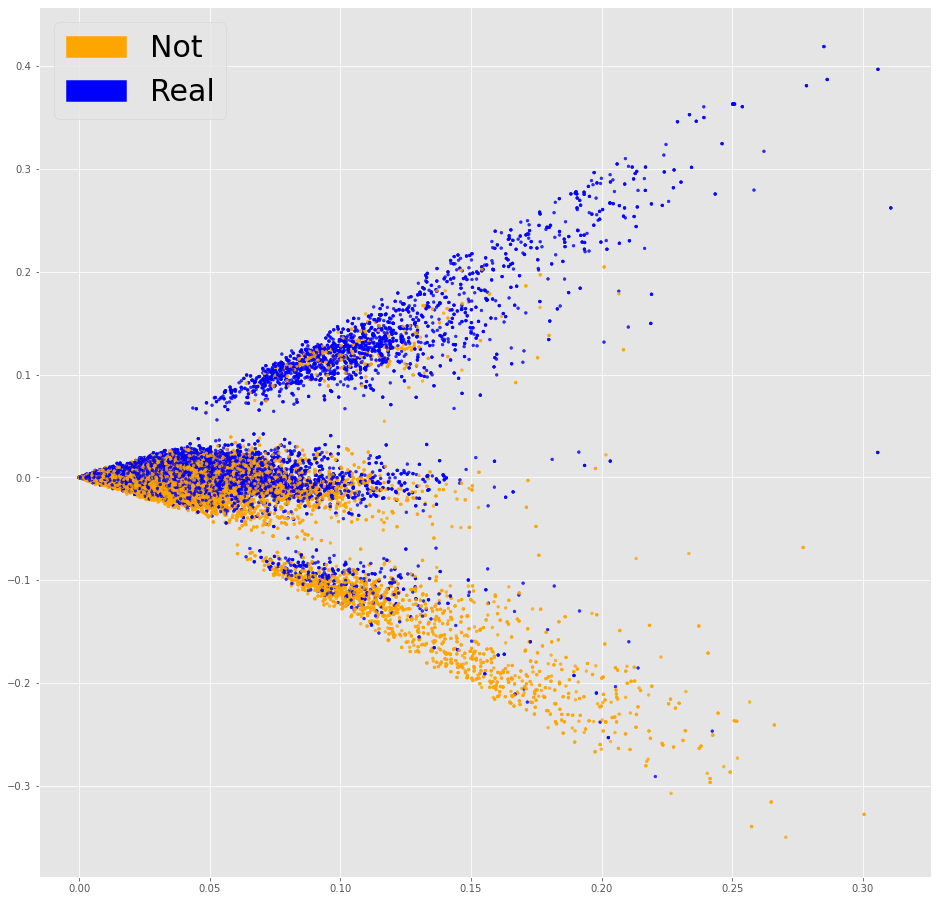

In [222]:
fig = plt.figure(figsize=(16, 16))          
plot_LSA(X_train_tfidf, y_train)
plt.show()

#weighing words by how frequent they are in our dataset, discounting words that are too frequent

# Training Model<a class="anchor" id="11"></a>

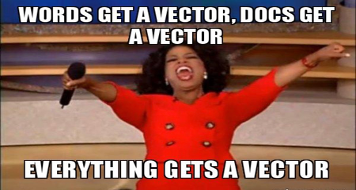

In [223]:
df2

,article_link,headline,is_sarcastic,length
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues secret black c...,0,78
1,https://www.huffingtonpost.com/entry/roseanne-...,roseanne revival catches thorny political mood...,0,84
2,https://local.theonion.com/mom-starting-to-fea...,mom starting fear sons web series closest thin...,1,79
3,https://politics.theonion.com/boehner-just-wan...,boehner wants wife listen come alternative deb...,1,84
4,https://www.huffingtonpost.com/entry/jk-rowlin...,jk rowling wishes snape happy birthday magical...,0,64
...,...,...,...,...
28614,https://www.theonion.com/jews-to-celebrate-ros...,jews celebrate rosh hashasha something,1,44
28615,https://local.theonion.com/internal-affairs-in...,internal affairs investigator disappointed con...,1,87
28616,https://www.huffingtonpost.com/entry/andrew-ah...,beautiful acceptance speech week came queer ko...,0,71
28617,https://www.theonion.com/mars-probe-destroyed-...,mars probe destroyed orbiting spielberggates s...,1,61


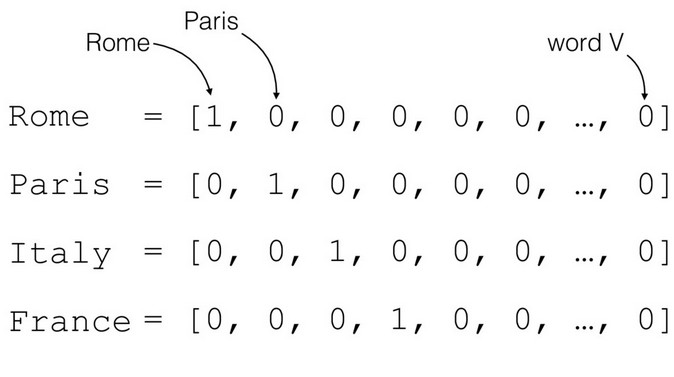

In [224]:
#long time for converting to vector
#Convert a collection of text documents to a matrix of token counts.
from sklearn.feature_extraction.text import CountVectorizer

X_train0,X_test0,y_train0,y_test0=train_test_split(df2['headline'],df2['is_sarcastic'],test_size=0.2)

def message_cleaning(message):
    Test_punc_removed = [char for char in message if char not in string.punctuation]
    Test_punc_removed_join = ''.join(Test_punc_removed)
    Test_punc_removed_join_clean = [word for word in Test_punc_removed_join.split() if word.lower() not in stopwords.words('english')]
    return Test_punc_removed_join_clean

#Whether the feature should be made of word n-gram or character n-grams.
vectorizer = CountVectorizer(analyzer = message_cleaning)
train_countvectorizer = vectorizer.fit_transform(X_train0)
test_countvectorizer = vectorizer.transform(X_test0)

print(vectorizer.get_feature_names())

['0', '00000000001', '00003', '02', '03', '1', '10', '100', '1000', '10000', '100000', '1000000', '100000aday', '10000th', '1000pound', '1000pump', '1000year', '100meter', '100mile', '100story', '100th', '100year', '100yearold', '1010911', '1015', '102', '1025', '103', '103yearold', '104', '104yearold', '105', '10565', '106', '107', '108', '109', '10blade', '10minute', '10monthold', '10pack', '10piece', '10pound', '10sided', '10step', '10story', '10th', '10thgrade', '10year', '10yearold', '11', '110', '112', '112th', '113', '113th', '114', '114000', '115', '116', '117', '11717', '117aerocar', '118', '11th', '11yearold', '11yearolds', '12', '120', '1200', '120000', '120year', '121', '1218', '1220', '1224', '1237', '12th', '12thcentury', '12yearold', '12yearolds', '13', '1300', '130000', '13000yearold', '131106', '134yearold', '135', '137', '138', '13hour', '13mile', '13th', '13yearold', '14', '140', '1400', '14000', '141', '142', '1433pound', '145', '146', '147', '1499', '149th', '14day

In [225]:
X_train = train_countvectorizer
y_train = y_train0

X_test = test_countvectorizer
y_test = y_test0

print("X train shape = ",X_train.shape)
print("y train shape = ",y_train.shape)
#total 28671 unique word vector

X train shape =  (44262, 28671)
y train shape =  (44262,)


# One word prediction-2<a class="anchor" id="12"></a>

In [228]:
from sklearn.metrics import accuracy_score

In [230]:
x_all

{'americans',
 'area',
 'back',
 'cant',
 'child',
 'every',
 'family',
 'finds',
 'getting',
 'going',
 'good',
 'guy',
 'hes',
 'home',
 'last',
 'little',
 'local',
 'mans',
 'mom',
 'nation',
 'nations',
 'parents',
 'really',
 'report',
 'school',
 'still',
 'study',
 'work',
 'would'}

In [232]:
result = []
for text in X_train0:
    if 'americans' in text:
        result.append(0)
    else:
        result.append(1)
accuracy_score(y_train0, result)

0.45429488048438843

In [239]:
for seq in x_all:
    result = []
    #print(seq)
    for text in X_train0:
        if seq in text:
            result.append(0)
        else:
            result.append(1)
    print(seq,': ',accuracy_score(y_train0, result))
#use 30 first one word from only sarcastic corpus(already tokenization) to predict

really :  0.4579097193981293
nations :  0.4532556142966879
area :  0.44060367809859474
parents :  0.45666711852153086
good :  0.4566897112647418
cant :  0.4562830418869459
still :  0.4539108038498034
guy :  0.4538656183633817
mans :  0.45273598120283765
work :  0.4525552392571506
back :  0.4559215579955718
getting :  0.45603452171162623
going :  0.45404636030906875
home :  0.4574578645339117
hes :  0.4526907957164159
finds :  0.4523519045682527
little :  0.45485969906466045
nation :  0.44650038407663456
study :  0.451154489178076
mom :  0.4588586146129863
every :  0.4540689530522796
school :  0.4580678686006055
americans :  0.45429488048438843
report :  0.44489629930866204
child :  0.4549048845510822
last :  0.45413673128191223
family :  0.454565993402919
local :  0.45284894491889205
would :  0.45619267091410237


## this is also a good dataset because only one word can't be better than model

# Logistic Regression<a class="anchor" id="13"></a>

[[4389 1620]
 [3016 2041]]


<AxesSubplot:>

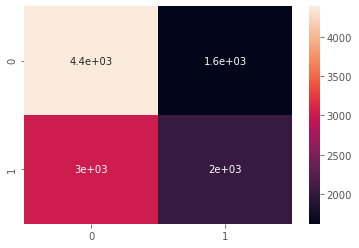

In [124]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix


LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train,y_train)

fig = plt.figure(figsize=(6, 4))    
y_predict_train_lr = LR.predict(X_test)
cm = confusion_matrix(y_test, y_predict_train_lr)
print(cm)
sns.heatmap(cm, annot = True)

In [125]:
print(classification_report(y_test, y_predict_train_lr))

              precision    recall  f1-score   support

           0       0.59      0.73      0.65      6009
           1       0.56      0.40      0.47      5057

    accuracy                           0.58     11066
   macro avg       0.58      0.57      0.56     11066
weighted avg       0.58      0.58      0.57     11066



In [126]:
import sklearn.metrics as metrics
print(metrics.accuracy_score(y_test, y_predict_train_lr))

0.5810590999457799


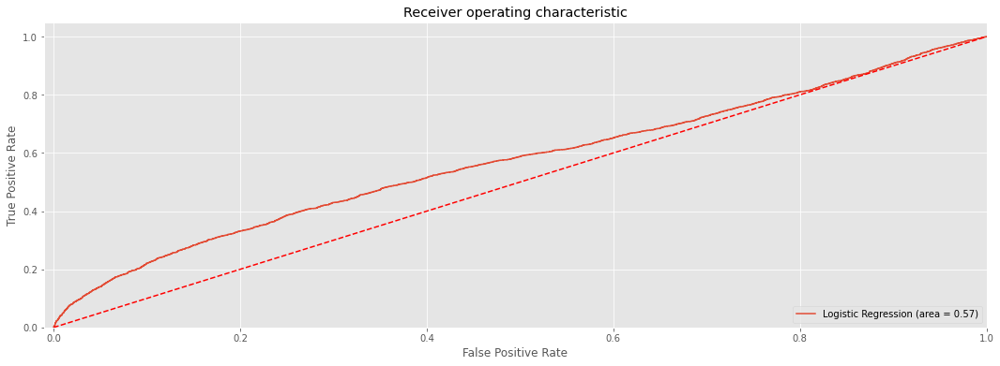

In [127]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

logit_roc_auc = roc_auc_score(y_test, LR.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, LR.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

ROC curve, is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied.

# Decision Tree<a class="anchor" id="14"></a>

[[5593  416]
 [ 518 4539]]


<AxesSubplot:>

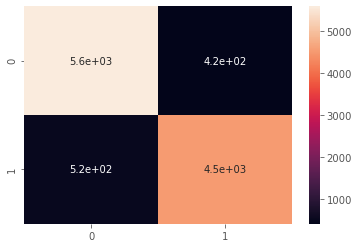

In [128]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix

classifier = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
classifier.fit(X_train, y_train)

fig = plt.figure(figsize=(6, 4))    
y_predict_train_dt = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_predict_train_dt)
print(cm)
sns.heatmap(cm, annot = True)

In [129]:
print(classification_report(y_test, y_predict_train_dt))

              precision    recall  f1-score   support

           0       0.92      0.93      0.92      6009
           1       0.92      0.90      0.91      5057

    accuracy                           0.92     11066
   macro avg       0.92      0.91      0.91     11066
weighted avg       0.92      0.92      0.92     11066



In [130]:
print(metrics.accuracy_score(y_test, y_predict_train_dt))

0.9155973251400686


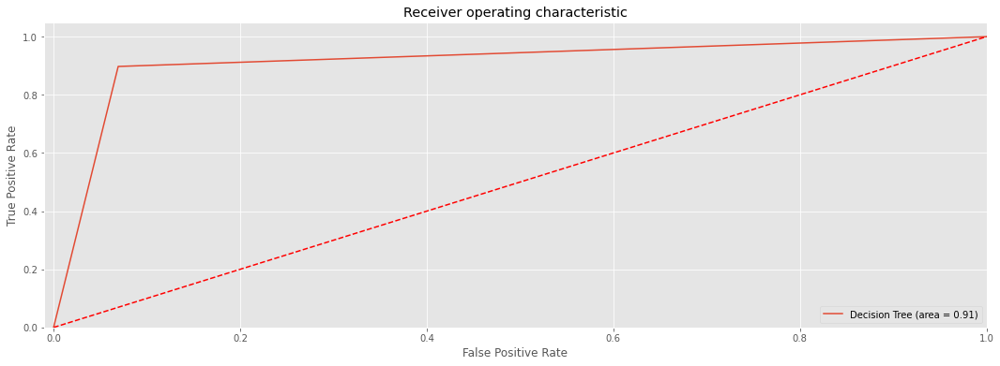

In [131]:
logit_roc_auc = roc_auc_score(y_test, classifier.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, classifier.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Decision Tree (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# Random Forest<a class="anchor" id="15"></a>

[[5693  316]
 [ 774 4283]]


<AxesSubplot:>

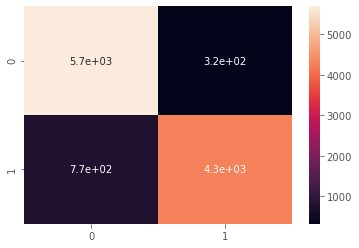

In [132]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

classifier1 = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
classifier1.fit(X_train, y_train)

fig = plt.figure(figsize=(6, 4))    
y_predict_train_rf = classifier1.predict(X_test)
cm = confusion_matrix(y_test, y_predict_train_rf)
print(cm)
sns.heatmap(cm, annot = True)

In [133]:
print(classification_report(y_test, y_predict_train_rf))

              precision    recall  f1-score   support

           0       0.88      0.95      0.91      6009
           1       0.93      0.85      0.89      5057

    accuracy                           0.90     11066
   macro avg       0.91      0.90      0.90     11066
weighted avg       0.90      0.90      0.90     11066



In [134]:
print(metrics.accuracy_score(y_test, y_predict_train_rf))

0.9015000903668896


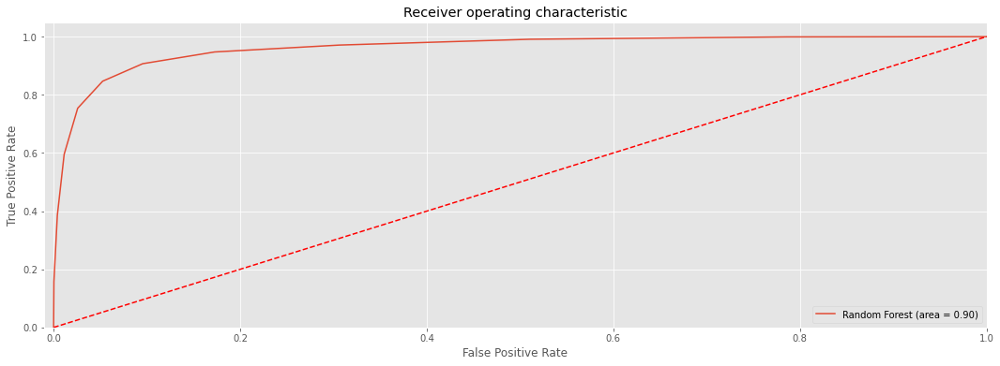

In [135]:
logit_roc_auc = roc_auc_score(y_test, classifier1.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, classifier1.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Random Forest (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# Naive bayes<a class="anchor" id="16"></a>

[[4519 1490]
 [3285 1772]]


<AxesSubplot:>

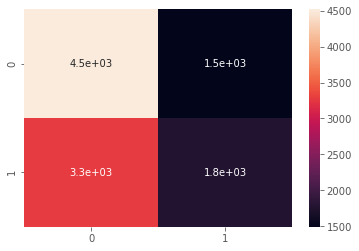

In [141]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix

NB_classifier = MultinomialNB()
NB_classifier.fit(X_train, y_train)

fig = plt.figure(figsize=(6, 4))    
y_predict_train_nb = NB_classifier.predict(X_test)
cm = confusion_matrix(y_test, y_predict_train_nb)
print(cm)
sns.heatmap(cm, annot = True)

In [142]:
print(classification_report(y_test, y_predict_train_nb))

              precision    recall  f1-score   support

           0       0.58      0.75      0.65      6009
           1       0.54      0.35      0.43      5057

    accuracy                           0.57     11066
   macro avg       0.56      0.55      0.54     11066
weighted avg       0.56      0.57      0.55     11066



In [143]:
print(metrics.accuracy_score(y_test, y_predict_train_nb))

0.5684981022953189


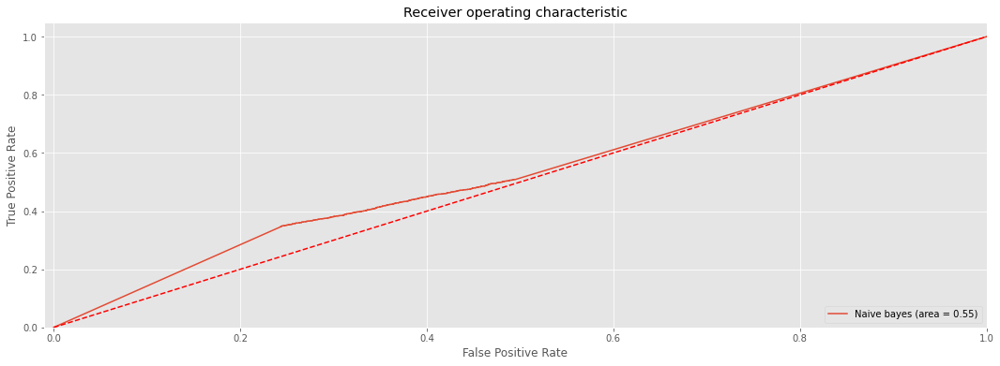

In [144]:
logit_roc_auc = roc_auc_score(y_test, NB_classifier.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, NB_classifier.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Naive bayes (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# Glove<a class="anchor" id="17"></a>

GloVe is essentially a log-bilinear model with a weighted least-squares objective.
*Glove: train classifier to predict conditional probability of two words in same context. 

simple observation that ratios of word-word co-occurrence probabilities have the potential for encoding some form of meaning

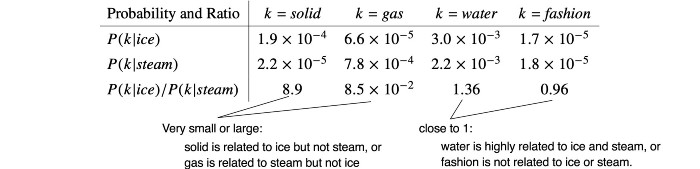

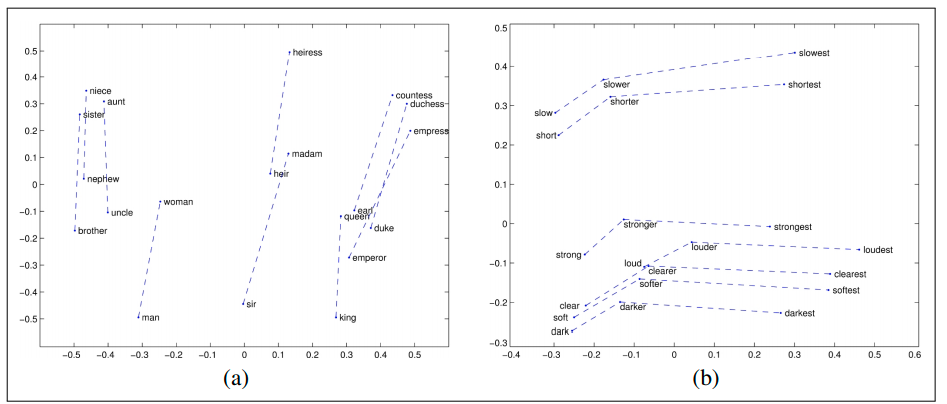

In [93]:
df2

,article_link,headline,is_sarcastic,length
0,https://www.huffingtonpost.com/entry/versace-b...,former versace store clerk sues secret black c...,0,78
1,https://www.huffingtonpost.com/entry/roseanne-...,roseanne revival catches thorny political mood...,0,84
2,https://local.theonion.com/mom-starting-to-fea...,mom starting fear sons web series closest thin...,1,79
3,https://politics.theonion.com/boehner-just-wan...,boehner wants wife listen come alternative deb...,1,84
4,https://www.huffingtonpost.com/entry/jk-rowlin...,jk rowling wishes snape happy birthday magical...,0,64
...,...,...,...,...
28614,https://www.theonion.com/jews-to-celebrate-ros...,jews celebrate rosh hashasha something,1,44
28615,https://local.theonion.com/internal-affairs-in...,internal affairs investigator disappointed con...,1,87
28616,https://www.huffingtonpost.com/entry/andrew-ah...,beautiful acceptance speech week came queer ko...,0,71
28617,https://www.theonion.com/mars-probe-destroyed-...,mars probe destroyed orbiting spielberggates s...,1,61


In [84]:
def create_corpus_new(df2):
    corpus=[]
    for news in tqdm(df2['headline']):
        words=[word.lower() for word in word_tokenize(news)]
        corpus.append(words)
    return corpus  

corpus=create_corpus_new(df2)
print(corpus)

100%|█████████████████████████████████████████████████████████████████████████| 55328/55328 [00:03<00:00, 14467.54it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Use word embedding to help collecting meaning: word meaning <-> word embedding

Word embeddings are a type of word representation that allows words with similar meaning to have a similar representation.

Word Embedding: transform word to number to reduce vector space(one-hot in genearal)

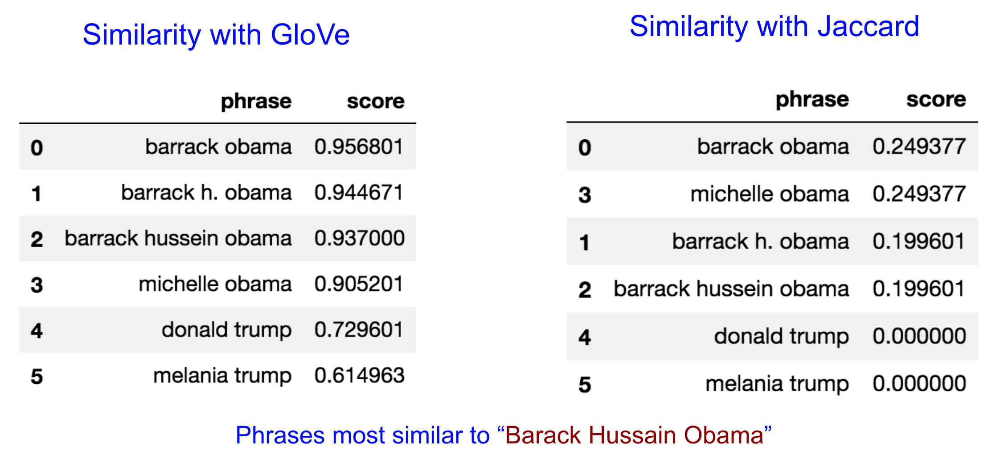

In [85]:
embedding_dict={}
#Pre-train
with open(r'C:\Users\Admin\Pythons work\glove6B\glove.6B.300d.txt','r') as f:
    for line in f:
        values=line.split()
        word = values[0]
        vectors=np.asarray(values[1:],'float32')
        embedding_dict[word]=vectors
f.close()

In [86]:
#convert data to vector using tokenizer 
MAX_LEN=50
tokenizer_obj=Tokenizer()
tokenizer_obj.fit_on_texts(corpus)
sequences=tokenizer_obj.texts_to_sequences(corpus)

#pad sequence
#Turns the lists of integers into a 2D integer tensor of shape (sequences, maxlen)
tweet_pad=pad_sequences(sequences,maxlen=MAX_LEN,truncating='post',padding='post')

word_index=tokenizer_obj.word_index
print('Number of unique words:',len(word_index))

Number of unique words: 29625


In [88]:
num_words=len(word_index)+1
#create embedding matrix to iterate model in it
embedding_matrix=np.zeros((num_words,300))

#visualize bar
for word,i in tqdm(word_index.items()):
    if i < num_words:
        emb_vec=embedding_dict.get(word)
        if emb_vec is not None: #add words vector to matrix if found word
            embedding_matrix[i]=emb_vec 
            
tweet_pad[0][0:]

100%|████████████████████████████████████████████████████████████████████████| 29625/29625 [00:00<00:00, 555077.22it/s]


array([  211, 15416,   654,  3537,  2283,   264,    34,  2088,  2553,
        8721,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0])

# Train Glove<a class="anchor" id="18"></a>

https://www.kaggle.com/shahules/basic-eda-cleaning-and-glove

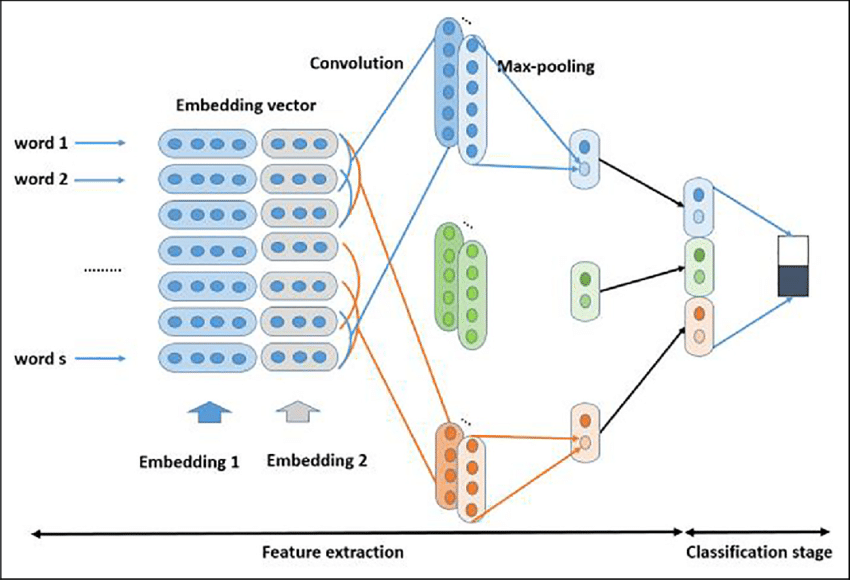

In [98]:
model=Sequential()

embedding=Embedding(num_words,300,embeddings_initializer=Constant(embedding_matrix),
                   input_length=MAX_LEN,trainable=False)

#Turns positive integers (indexes) into dense vectors of fixed size.
model.add(embedding) #2d tensor->3d tensor
model.add(SpatialDropout1D(0.2))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2)) #dropout 10%
model.add(Dense(1, activation='sigmoid')) #Dense into 1 layer


optimzer=Adam(learning_rate=3e-4)

model.compile(loss='binary_crossentropy',optimizer=optimzer,metrics=['accuracy'])

In [99]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 50, 300)           8887800   
_________________________________________________________________
spatial_dropout1d (SpatialDr (None, 50, 300)           0         
_________________________________________________________________
lstm (LSTM)                  (None, 100)               160400    
_________________________________________________________________
dense (Dense)                (None, 1)                 101       
Total params: 9,048,301
Trainable params: 160,501
Non-trainable params: 8,887,800
_________________________________________________________________


In [100]:
train_glove=tweet_pad[:df2.shape[0]]
test_glove=tweet_pad[df2.shape[0]:]

In [101]:
tweet_pad

array([[  211, 15416,   654, ...,     0,     0,     0],
       [ 8332,  3369,  2554, ...,     0,     0,     0],
       [   68,   640,   710, ...,     0,     0,     0],
       ...,
       [  475,  3250,   220, ...,     0,     0,     0],
       [ 1713,  1139,  3271, ...,     0,     0,     0],
       [  121,  3542,   176, ...,     0,     0,     0]])

In [102]:
train_glove

array([[  211, 15416,   654, ...,     0,     0,     0],
       [ 8332,  3369,  2554, ...,     0,     0,     0],
       [   68,   640,   710, ...,     0,     0,     0],
       ...,
       [  475,  3250,   220, ...,     0,     0,     0],
       [ 1713,  1139,  3271, ...,     0,     0,     0],
       [  121,  3542,   176, ...,     0,     0,     0]])

In [103]:
test_glove

array([], shape=(0, 50), dtype=int32)

In [104]:
X_train,X_test,y_train,y_test=train_test_split(train_glove,df2['is_sarcastic'].values,test_size=0.2)
print('Shape of train',X_train.shape)
print("Shape of Validation ",X_test.shape)

Shape of train (44262, 50)
Shape of Validation  (11066, 50)


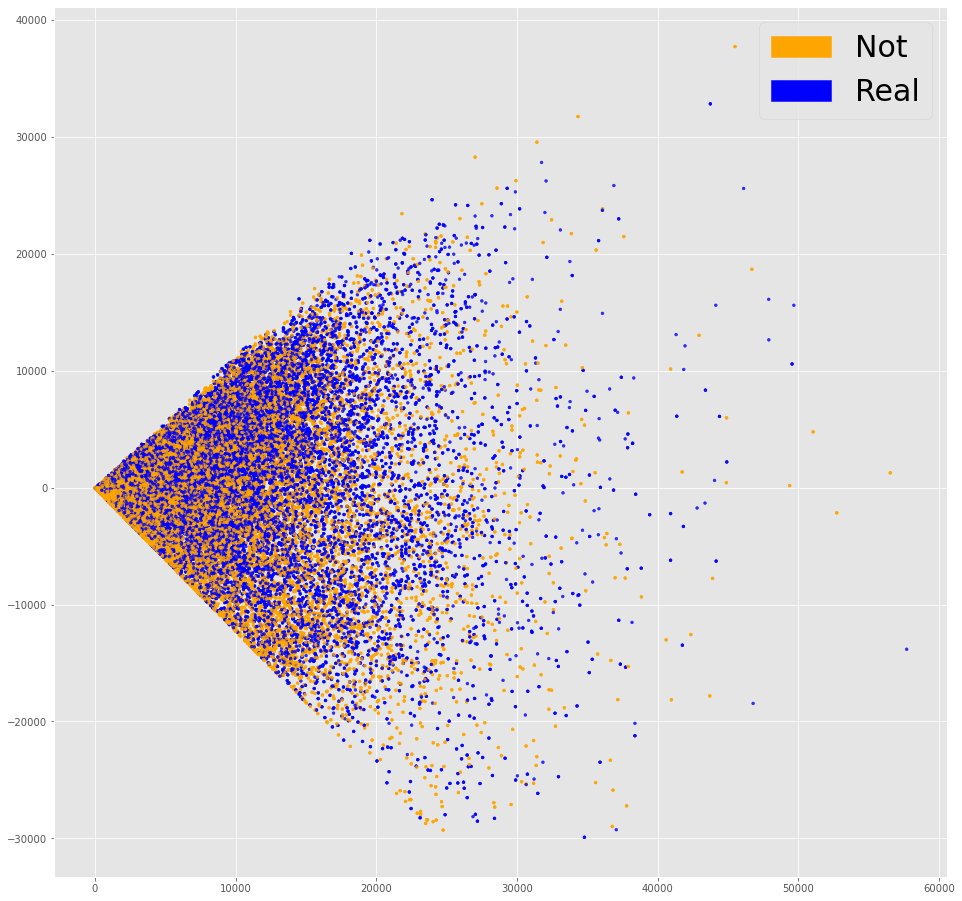

In [105]:
fig = plt.figure(figsize=(16, 16))          
plot_LSA(train_glove,df2['is_sarcastic'])
plt.show()

In [106]:
#about 80 minutes to run
history=model.fit(X_train,y_train,batch_size=4,epochs=20,validation_data=(X_test,y_test),verbose=2)

Epoch 1/20
11066/11066 - 228s - loss: 0.5662 - accuracy: 0.7148 - val_loss: 0.4844 - val_accuracy: 0.7861
Epoch 2/20
11066/11066 - 230s - loss: 0.4659 - accuracy: 0.7854 - val_loss: 0.4124 - val_accuracy: 0.8123
Epoch 3/20
11066/11066 - 232s - loss: 0.4113 - accuracy: 0.8142 - val_loss: 0.3731 - val_accuracy: 0.8284
Epoch 4/20
11066/11066 - 231s - loss: 0.3675 - accuracy: 0.8370 - val_loss: 0.3405 - val_accuracy: 0.8553
Epoch 5/20
11066/11066 - 232s - loss: 0.3316 - accuracy: 0.8552 - val_loss: 0.3140 - val_accuracy: 0.8678
Epoch 6/20
11066/11066 - 232s - loss: 0.3055 - accuracy: 0.8708 - val_loss: 0.2943 - val_accuracy: 0.8735
Epoch 7/20
11066/11066 - 232s - loss: 0.2771 - accuracy: 0.8841 - val_loss: 0.2855 - val_accuracy: 0.8804
Epoch 8/20
11066/11066 - 231s - loss: 0.2589 - accuracy: 0.8921 - val_loss: 0.2655 - val_accuracy: 0.8951
Epoch 9/20
11066/11066 - 231s - loss: 0.2402 - accuracy: 0.9018 - val_loss: 0.2519 - val_accuracy: 0.9010
Epoch 10/20
11066/11066 - 230s - loss: 0.2290 

In [107]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Accuracy: 93.14%


In [108]:
train_pred_GloVe = model.predict(train_glove)
train_pred_GloVe_int = train_pred_GloVe.round().astype('int')

In [109]:
print(history)

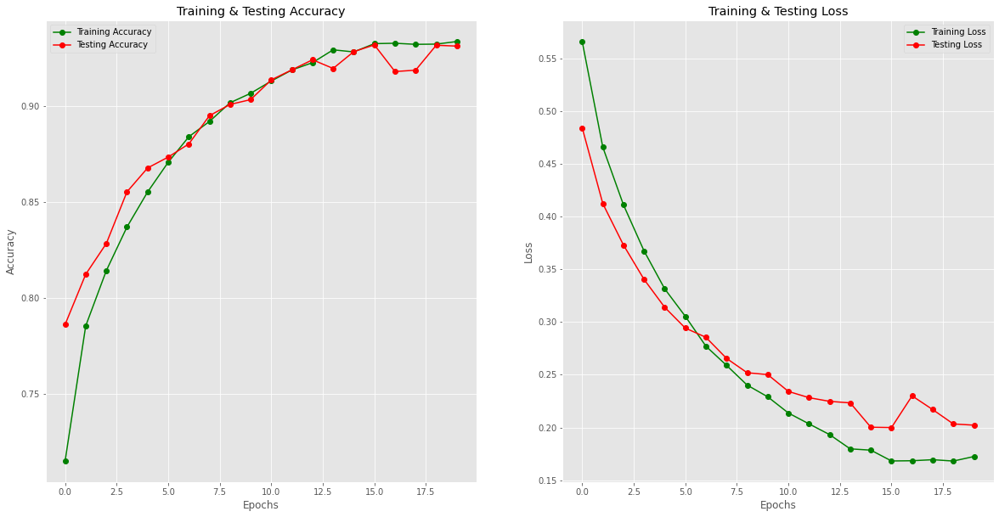

In [110]:
epochs = [i for i in range(20)]
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
fig.set_size_inches(20,10)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Testing Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'go-' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'ro-' , label = 'Testing Loss')
ax[1].set_title('Training & Testing Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

# Confusion Matrix<a class="anchor" id="19"></a>

In [111]:
# Showing Confusion Matrix
def plot_cm(y_true, y_pred, title, figsize=(5,5)):
    cm = confusion_matrix(y_true, y_pred, labels=np.unique(y_true))
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100
    annot = np.empty_like(cm).astype(str)
    nrows, ncols = cm.shape
    for i in range(nrows):
        for j in range(ncols):
            c = cm[i, j]
            p = cm_perc[i, j]
            if i == j:
                s = cm_sum[i]
                annot[i, j] = '%.1f%%\n%d/%d' % (p, c, s)
            elif c == 0:
                annot[i, j] = ''
            else:
                annot[i, j] = '%.1f%%\n%d' % (p, c)
    cm = pd.DataFrame(cm, index=np.unique(y_true), columns=np.unique(y_true))
    cm.index.name = 'Actual'
    cm.columns.name = 'Predicted'
    fig, ax = plt.subplots(figsize=figsize)
    plt.title(title)
    sns.heatmap(cm, cmap= "YlGnBu", annot=annot, fmt='', ax=ax)

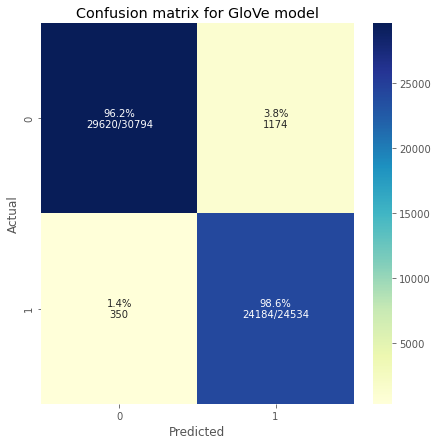

In [112]:
plot_cm(train_pred_GloVe_int, df2['is_sarcastic'].values, 'Confusion matrix for GloVe model', figsize=(7,7))

In [113]:
print(classification_report(df2['is_sarcastic'].values, train_pred_GloVe_int))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97     29970
           1       0.99      0.95      0.97     25358

    accuracy                           0.97     55328
   macro avg       0.97      0.97      0.97     55328
weighted avg       0.97      0.97      0.97     55328



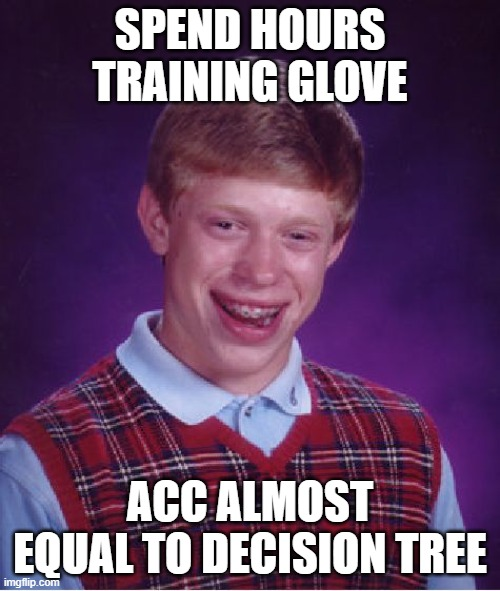

# Compare with others<a class="anchor" id="20"></a>

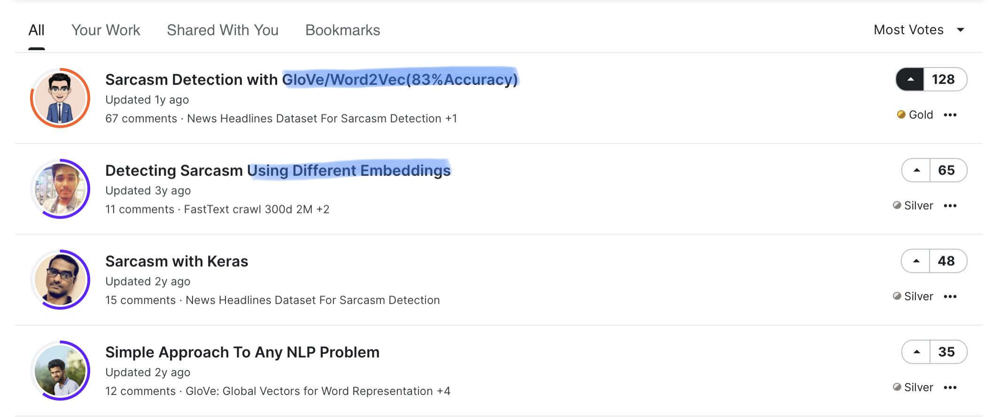

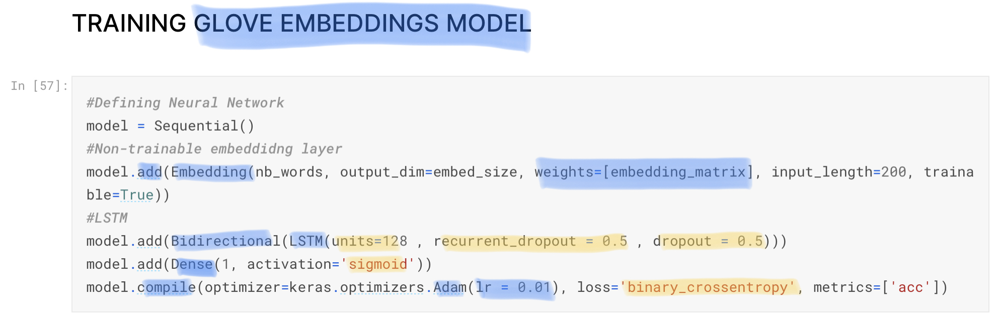

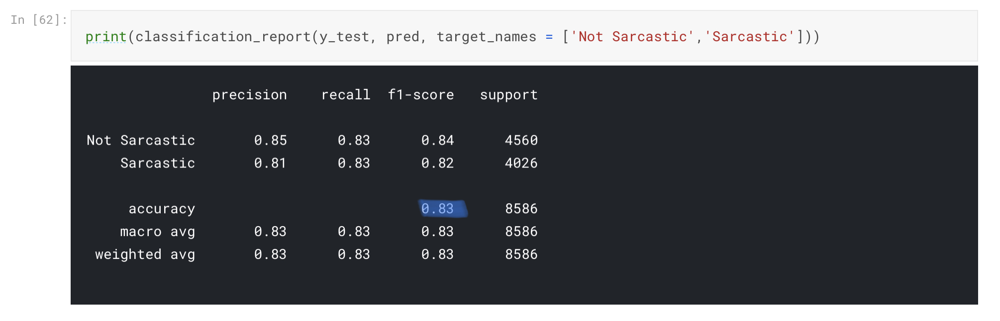

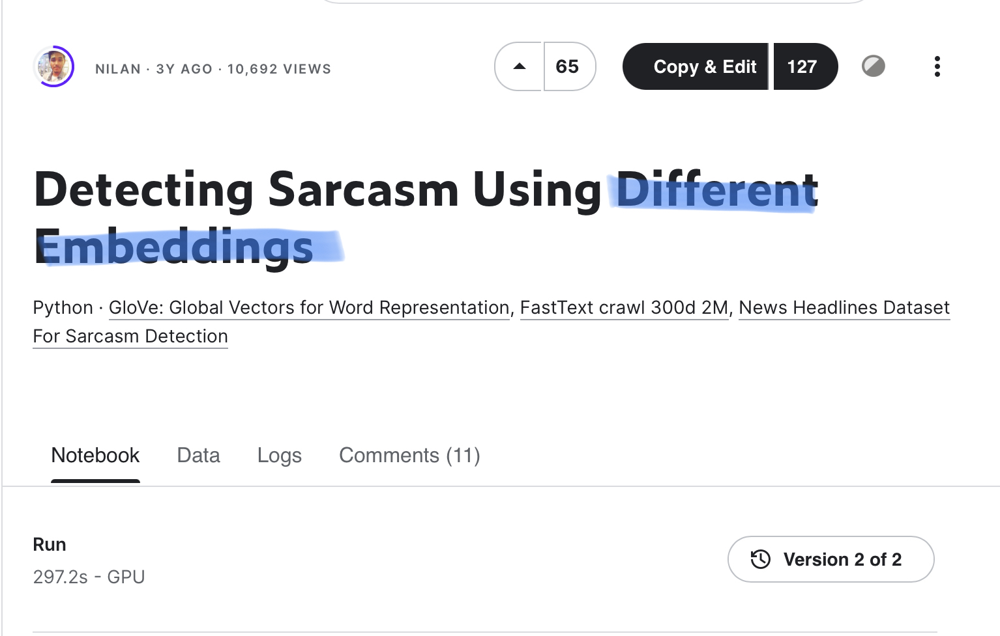

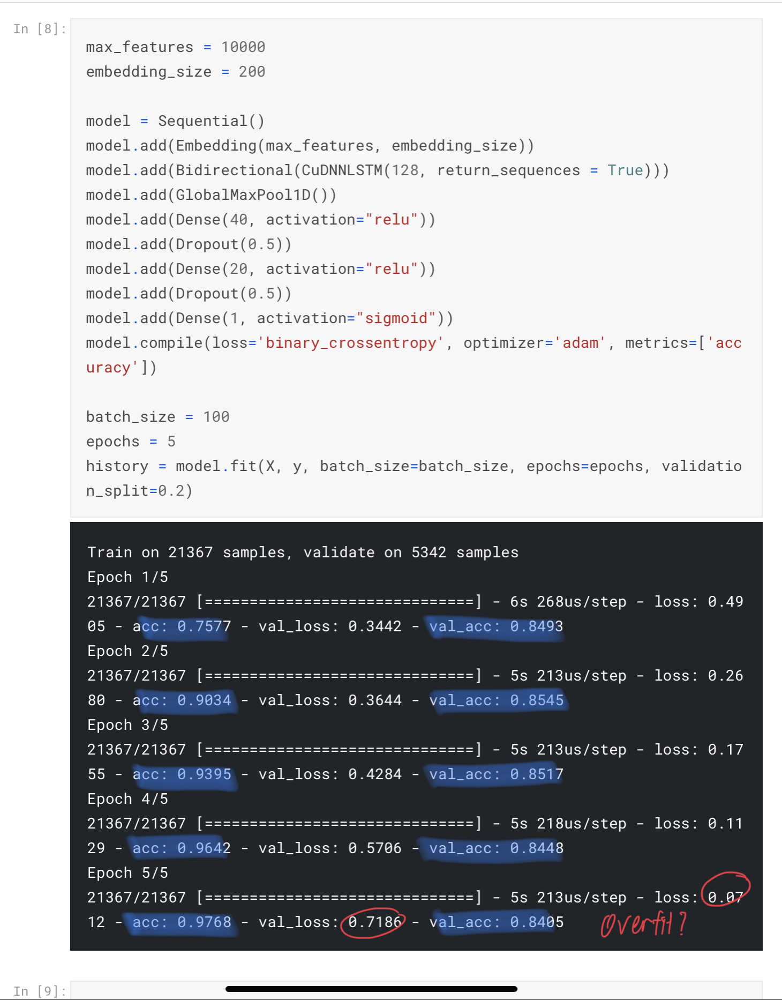

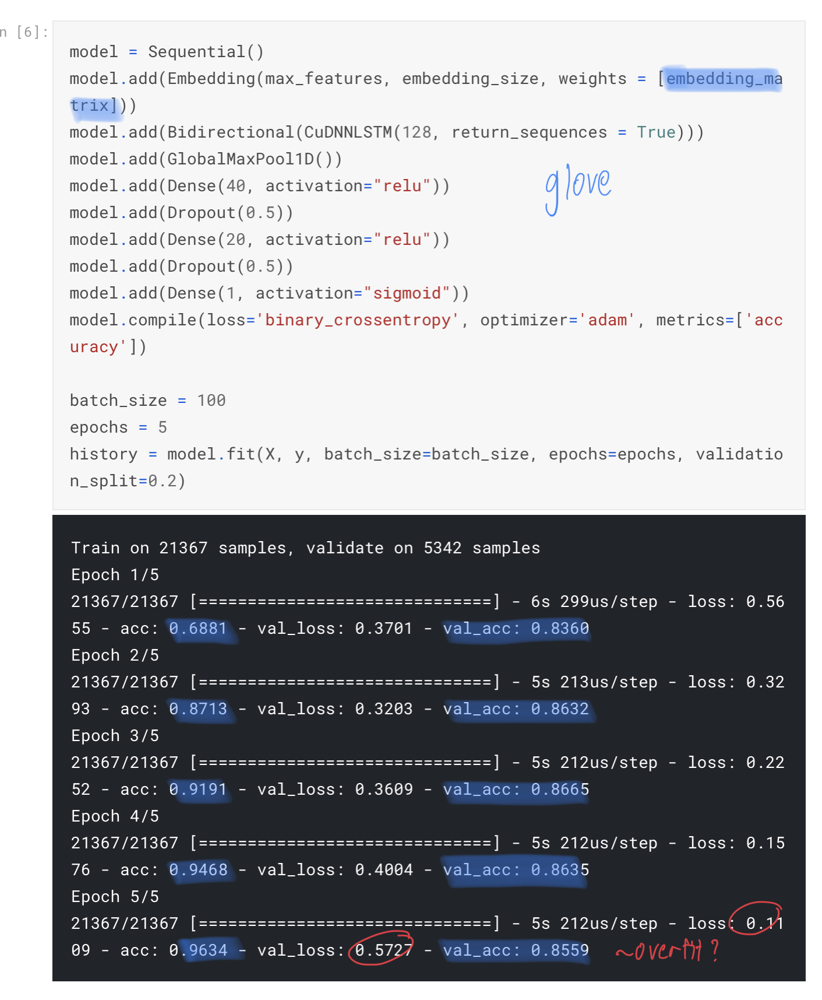

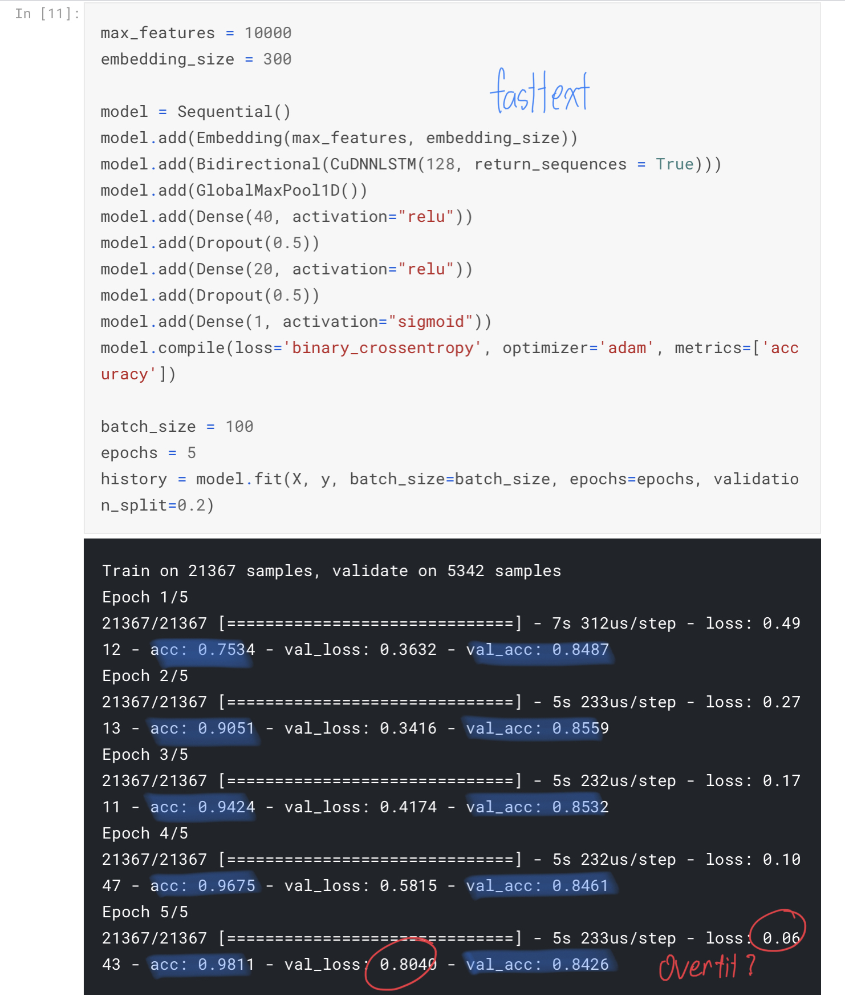

# Summary<a class="anchor" id="21"></a>

- train model with Glove(with pre-train) have 93.14% accuracy.
- train model with decision tree get 91.5% and random forest get 90.1%.
- model with Glove require long time (about 80 minutes).
- model with Glove is not overfit nor underfit.
- we need to look into dataset everytime.
- we need to plot word distribution to find if that dataset is bias or not
- large dataset is good, but separate them is need too.
- if we want a fast model, we can use random forest or decision tree.
- sometime, we don't need to find complicate model



Method that can be applied

- fasttext
- BERT
- word2vec (not recommend)

Future work

- Classify fake news 
- Sentiment analysis

Note: this work is only basic of classification in NLP. In real world, we have many factors and sometime we can't manage to clean all of our datas, I hope to evaluate work in this field to the point that we can attain clear and correct output from fake news detection from raw data!!, which is not easy at all. I have shown that bad dataset with different characteristic in data can separate or classify data easily, but again in reality we don't have time to clean data that mean we can get bias data or unclear data. This data is very good data to the point that we can classify it with basic tool.

--------------------------------

# Thanks for Listening

--------------------------------

# Special: Glove; 50D 100D 200D 300D???<a class="anchor" id="22"></a>

In [57]:
df2.describe()

,is_sarcastic,length
count,55328.000000,55328.000000
mean,0.458321,61.633712
std,0.498264,20.008963
min,0.000000,7.000000
25%,0.000000,48.000000
50%,0.000000,62.000000
75%,1.000000,74.000000
max,1.000000,926.000000


## 100D

In [60]:
corpus100 = create_corpus_new(df2)
corpus100

embedding_dict100={}
with open(r'C:\Users\Admin\Pythons work\glove6B\glove.6B.100d.txt','r') as f:
    for line in f:
        values=line.split()
        word = values[0]
        vectors=np.asarray(values[1:],'float32')
        embedding_dict100[word]=vectors
f.close()

100%|█████████████████████████████████████████████████████████████████████████| 55328/55328 [00:03<00:00, 13924.26it/s]


In [61]:
MAX_LEN=50
tokenizer_obj=Tokenizer()
tokenizer_obj.fit_on_texts(corpus100)
sequences=tokenizer_obj.texts_to_sequences(corpus100)

tweet_pad=pad_sequences(sequences,maxlen=MAX_LEN,truncating='post',padding='post')

word_index=tokenizer_obj.word_index
print('Number of unique words:',len(word_index))

Number of unique words: 29625


In [64]:
num_words=len(word_index)+1
embedding_matrix100=np.zeros((num_words,100))

for word,i in tqdm(word_index.items()):
    if i < num_words:
        emb_vec=embedding_dict100.get(word)
        if emb_vec is not None:
            embedding_matrix100[i]=emb_vec 
            
model=Sequential()

embedding=Embedding(num_words,100,embeddings_initializer=Constant(embedding_matrix100),
                   input_length=MAX_LEN,trainable=False)

model.add(embedding)
model.add(SpatialDropout1D(0.2))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(1, activation='sigmoid'))


optimzer=Adam(learning_rate=3e-4)

model.compile(loss='binary_crossentropy',optimizer=optimzer,metrics=['accuracy'])
model.summary()

train_glove=tweet_pad[:df2.shape[0]]
test_glove=tweet_pad[df2.shape[0]:]

100%|████████████████████████████████████████████████████████████████████████| 29625/29625 [00:00<00:00, 660073.82it/s]

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 50, 100)           2962600   
_________________________________________________________________
spatial_dropout1d_1 (Spatial (None, 50, 100)           0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 101       
Total params: 3,043,101
Trainable params: 80,501
Non-trainable params: 2,962,600
_________________________________________________________________


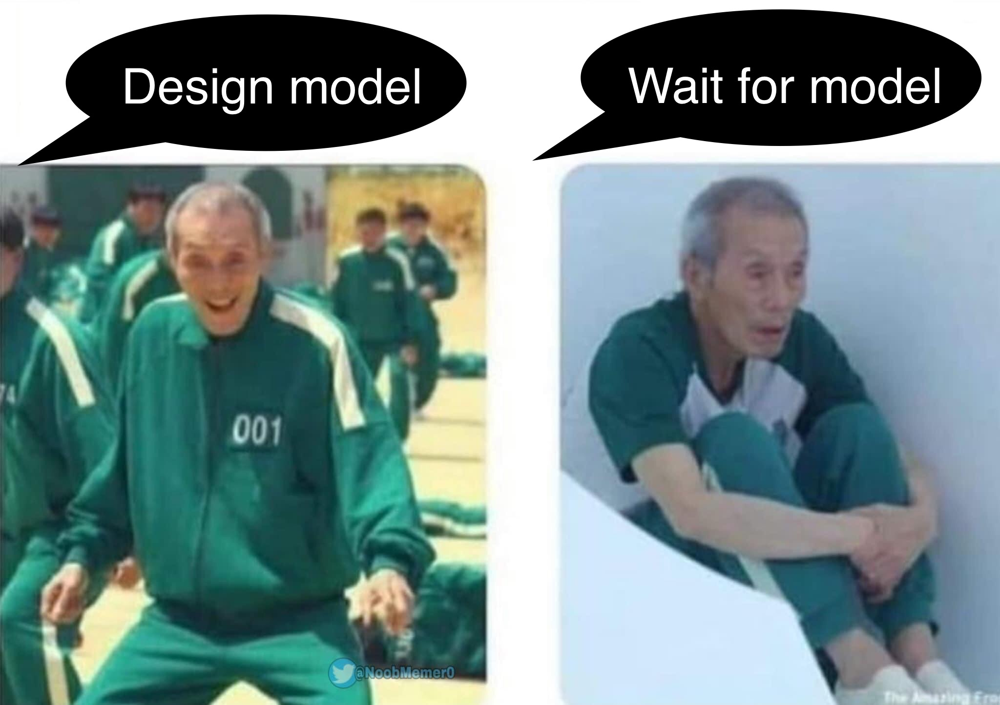

In [65]:
X_train,X_test,y_train,y_test=train_test_split(train_glove,df2['is_sarcastic'].values,test_size=0.2)

history=model.fit(X_train,y_train,batch_size=4,epochs=20,validation_data=(X_test,y_test),verbose=2)

Epoch 1/20
11066/11066 - 213s - loss: 0.5880 - accuracy: 0.6973 - val_loss: 0.5332 - val_accuracy: 0.7625
Epoch 2/20
11066/11066 - 222s - loss: 0.5128 - accuracy: 0.7533 - val_loss: 0.4586 - val_accuracy: 0.7875
Epoch 3/20
11066/11066 - 226s - loss: 0.4763 - accuracy: 0.7756 - val_loss: 0.4356 - val_accuracy: 0.8031
Epoch 4/20
11066/11066 - 225s - loss: 0.4470 - accuracy: 0.7944 - val_loss: 0.4104 - val_accuracy: 0.8154
Epoch 5/20
11066/11066 - 226s - loss: 0.4262 - accuracy: 0.8047 - val_loss: 0.3895 - val_accuracy: 0.8249
Epoch 6/20
11066/11066 - 227s - loss: 0.4068 - accuracy: 0.8148 - val_loss: 0.3811 - val_accuracy: 0.8329
Epoch 7/20
11066/11066 - 228s - loss: 0.3939 - accuracy: 0.8237 - val_loss: 0.3825 - val_accuracy: 0.8288
Epoch 8/20
11066/11066 - 228s - loss: 0.3810 - accuracy: 0.8308 - val_loss: 0.3453 - val_accuracy: 0.8477
Epoch 9/20
11066/11066 - 227s - loss: 0.3657 - accuracy: 0.8374 - val_loss: 0.3459 - val_accuracy: 0.8506
Epoch 10/20
11066/11066 - 228s - loss: 0.3580 

In [66]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

train_pred_GloVe = model.predict(train_glove)
train_pred_GloVe_int = train_pred_GloVe.round().astype('int')

Accuracy: 85.51%


In [67]:
print(classification_report(df2['is_sarcastic'].values, train_pred_GloVe_int))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91     29970
           1       0.96      0.79      0.87     25358

    accuracy                           0.89     55328
   macro avg       0.90      0.88      0.89     55328
weighted avg       0.90      0.89      0.89     55328



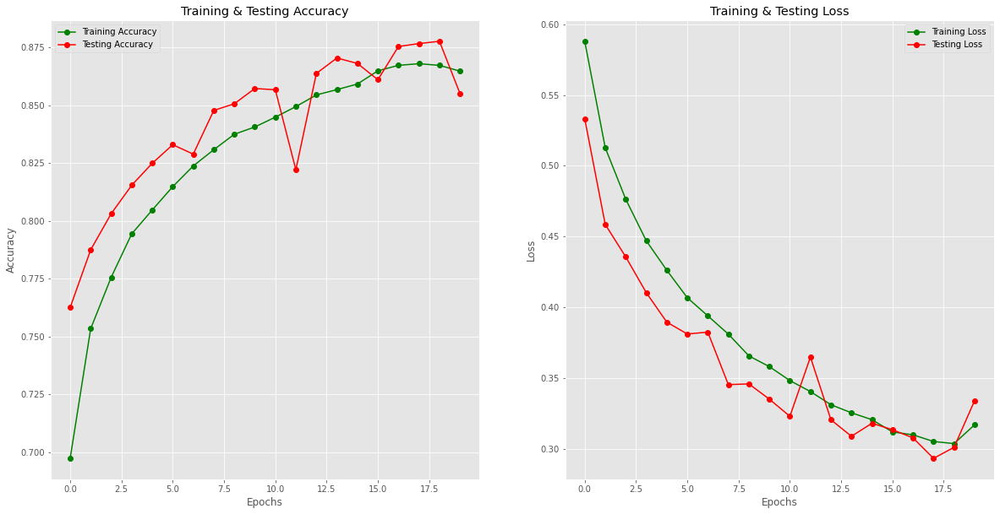

In [68]:
epochs = [i for i in range(20)]
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
fig.set_size_inches(20,10)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Testing Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'go-' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'ro-' , label = 'Testing Loss')
ax[1].set_title('Training & Testing Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

## 200D

In [71]:
corpus200 = create_corpus_new(df2)
corpus200

embedding_dict200={}
with open(r'C:\Users\Admin\Pythons work\glove6B\glove.6B.200d.txt','r') as f:
    for line in f:
        values=line.split()
        word = values[0]
        vectors=np.asarray(values[1:],'float32')
        embedding_dict200[word]=vectors
f.close()

MAX_LEN=50
tokenizer_obj=Tokenizer()
tokenizer_obj.fit_on_texts(corpus200)
sequences=tokenizer_obj.texts_to_sequences(corpus200)

tweet_pad=pad_sequences(sequences,maxlen=MAX_LEN,truncating='post',padding='post')

word_index=tokenizer_obj.word_index

num_words=len(word_index)+1
embedding_matrix200=np.zeros((num_words,200))

for word,i in tqdm(word_index.items()):
    if i < num_words:
        emb_vec=embedding_dict200.get(word)
        if emb_vec is not None:
            embedding_matrix200[i]=emb_vec 
            
model=Sequential()

embedding=Embedding(num_words,200,embeddings_initializer=Constant(embedding_matrix200),
                   input_length=MAX_LEN,trainable=False)

model.add(embedding)
model.add(SpatialDropout1D(0.2))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(1, activation='sigmoid'))


optimzer=Adam(learning_rate=3e-4)

model.compile(loss='binary_crossentropy',optimizer=optimzer,metrics=['accuracy'])
model.summary()

train_glove=tweet_pad[:df2.shape[0]]
test_glove=tweet_pad[df2.shape[0]:]

X_train,X_test,y_train,y_test=train_test_split(train_glove,df2['is_sarcastic'].values,test_size=0.2)

history=model.fit(X_train,y_train,batch_size=4,epochs=20,validation_data=(X_test,y_test),verbose=2)

100%|████████████████████████████████████████████████████████████████████████| 29625/29625 [00:00<00:00, 623294.52it/s]


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 50, 200)           5925200   
_________________________________________________________________
spatial_dropout1d_2 (Spatial (None, 50, 200)           0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 100)               120400    
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 101       
Total params: 6,045,701
Trainable params: 120,501
Non-trainable params: 5,925,200
_________________________________________________________________
Epoch 1/20
11066/11066 - 231s - loss: 0.6372 - accuracy: 0.6363 - val_loss: 0.5771 - val_accuracy: 0.7214
Epoch 2/20
11066/11066 - 237s - loss: 0.5327 - accuracy: 0.7380 - val_loss: 0.4590 - val_accuracy: 0.7876
Epoch 3/20
11066/11066 -

In [72]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

train_pred_GloVe = model.predict(train_glove)
train_pred_GloVe_int = train_pred_GloVe.round().astype('int')

print(classification_report(df2['is_sarcastic'].values, train_pred_GloVe_int))

Accuracy: 88.70%
              precision    recall  f1-score   support

           0       0.93      0.95      0.94     29970
           1       0.93      0.92      0.93     25358

    accuracy                           0.93     55328
   macro avg       0.93      0.93      0.93     55328
weighted avg       0.93      0.93      0.93     55328



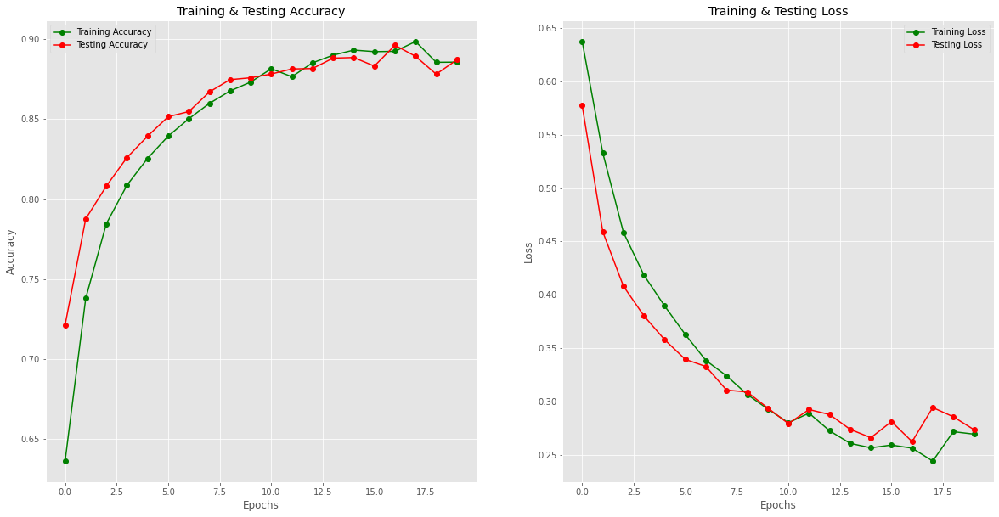

In [73]:
epochs = [i for i in range(20)]
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
fig.set_size_inches(20,10)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Testing Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'go-' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'ro-' , label = 'Testing Loss')
ax[1].set_title('Training & Testing Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

### While using equal time to train, 300D embedding word have efficient output.

# Special: Why I use V1 and V2<a class="anchor" id="23"></a>

## What if we use df2 which have more data than v1 and many use it

In [184]:
df5 = pd.read_json("Sarcasm_Headlines_Dataset_v2.json", lines=True)
df5

,is_sarcastic,headline,article_link
0,1,thirtysomething scientists unveil doomsday clo...,https://www.theonion.com/thirtysomething-scien...
1,0,dem rep. totally nails why congress is falling...,https://www.huffingtonpost.com/entry/donna-edw...
2,0,eat your veggies: 9 deliciously different recipes,https://www.huffingtonpost.com/entry/eat-your-...
3,1,inclement weather prevents liar from getting t...,https://local.theonion.com/inclement-weather-p...
4,1,mother comes pretty close to using word 'strea...,https://www.theonion.com/mother-comes-pretty-c...
...,...,...,...
28614,1,jews to celebrate rosh hashasha or something,https://www.theonion.com/jews-to-celebrate-ros...
28615,1,internal affairs investigator disappointed con...,https://local.theonion.com/internal-affairs-in...
28616,0,the most beautiful acceptance speech this week...,https://www.huffingtonpost.com/entry/andrew-ah...
28617,1,mars probe destroyed by orbiting spielberg-gat...,https://www.theonion.com/mars-probe-destroyed-...


In [187]:
def remove_punct(text):
    table=str.maketrans('','',string.punctuation)
    return text.translate(table)
def message_cleaning(message):
    Test_punc_removed = [char for char in message if char not in string.punctuation]
    Test_punc_removed_join = ''.join(Test_punc_removed)
    Test_punc_removed_join_clean = [word for word in Test_punc_removed_join.split() if word.lower() not in stopwords.words('english')]
    return Test_punc_removed_join_clean

df5['headline']=df5['headline'].apply(lambda x : remove_punct(x))

In [194]:
X_train1,X_test1,y_train1,y_test1=train_test_split(df5['headline'],df5['is_sarcastic'],test_size=0.2)

vectorizer = CountVectorizer(analyzer = message_cleaning)
train_countvectorizer = vectorizer.fit_transform(X_train1)
test_countvectorizer = vectorizer.transform(X_test1)

X_train2 = train_countvectorizer
y_train2 = y_train1
X_test2 = test_countvectorizer
y_test2 = y_test1

In [195]:
LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train2,y_train2)
y_predict_train_lr = LR.predict(X_test2)
print(classification_report(y_test2, y_predict_train_lr))

              precision    recall  f1-score   support

           0       0.69      0.88      0.77      3036
           1       0.81      0.55      0.66      2688

    accuracy                           0.73      5724
   macro avg       0.75      0.72      0.72      5724
weighted avg       0.75      0.73      0.72      5724



In [196]:
classifier = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
classifier.fit(X_train2, y_train2)
y_predict_train_dt = classifier.predict(X_test2)
print(classification_report(y_test2, y_predict_train_dt))

              precision    recall  f1-score   support

           0       0.74      0.77      0.75      3036
           1       0.73      0.70      0.71      2688

    accuracy                           0.73      5724
   macro avg       0.73      0.73      0.73      5724
weighted avg       0.73      0.73      0.73      5724



In [197]:
classifier1 = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
classifier1.fit(X_train2, y_train2)
y_predict_train_rf = classifier1.predict(X_test2)
print(classification_report(y_test2, y_predict_train_rf))

              precision    recall  f1-score   support

           0       0.71      0.88      0.78      3036
           1       0.81      0.59      0.68      2688

    accuracy                           0.74      5724
   macro avg       0.76      0.73      0.73      5724
weighted avg       0.76      0.74      0.73      5724



In [198]:
NB_classifier = MultinomialNB()
NB_classifier.fit(X_train2, y_train2)
y_predict_train_nb = NB_classifier.predict(X_test2)
print(classification_report(y_test2, y_predict_train_nb))

              precision    recall  f1-score   support

           0       0.82      0.83      0.82      3036
           1       0.80      0.80      0.80      2688

    accuracy                           0.81      5724
   macro avg       0.81      0.81      0.81      5724
weighted avg       0.81      0.81      0.81      5724



In [199]:
corpus=create_corpus_new(df5)

MAX_LEN=50
tokenizer_obj=Tokenizer()
tokenizer_obj.fit_on_texts(corpus)
sequences=tokenizer_obj.texts_to_sequences(corpus)

tweet_pad=pad_sequences(sequences,maxlen=MAX_LEN,truncating='post',padding='post')

word_index=tokenizer_obj.word_index

num_words=len(word_index)+1
embedding_matrix=np.zeros((num_words,300))

for word,i in tqdm(word_index.items()):
    if i < num_words:
        emb_vec=embedding_dict.get(word)
        if emb_vec is not None:
            embedding_matrix[i]=emb_vec 

model=Sequential()

embedding=Embedding(num_words,300,embeddings_initializer=Constant(embedding_matrix),
                   input_length=MAX_LEN,trainable=False)

model.add(embedding)
model.add(SpatialDropout1D(0.2))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(1, activation='sigmoid'))


optimzer=Adam(learning_rate=3e-4)

model.compile(loss='binary_crossentropy',optimizer=optimzer,metrics=['accuracy'])

100%|████████████████████████████████████████████████████████████████████████| 29657/29657 [00:00<00:00, 138290.92it/s]


In [202]:
train_glove=tweet_pad[:df5.shape[0]]
test_glove=tweet_pad[df5.shape[0]:]
X_train3,X_test3,y_train3,y_test3=train_test_split(train_glove,df5['is_sarcastic'].values,test_size=0.2)
history=model.fit(X_train3,y_train3,batch_size=4,epochs=20,validation_data=(X_test3,y_test3),verbose=2)

Epoch 1/20
5724/5724 - 111s - loss: 0.5735 - accuracy: 0.7092 - val_loss: 0.4675 - val_accuracy: 0.7925
Epoch 2/20
5724/5724 - 114s - loss: 0.4455 - accuracy: 0.7974 - val_loss: 0.3699 - val_accuracy: 0.8386
Epoch 3/20
5724/5724 - 115s - loss: 0.3909 - accuracy: 0.8300 - val_loss: 0.3539 - val_accuracy: 0.8494
Epoch 4/20
5724/5724 - 115s - loss: 0.3563 - accuracy: 0.8453 - val_loss: 0.3277 - val_accuracy: 0.8616
Epoch 5/20
5724/5724 - 116s - loss: 0.3238 - accuracy: 0.8615 - val_loss: 0.3118 - val_accuracy: 0.8658
Epoch 6/20
5724/5724 - 115s - loss: 0.3036 - accuracy: 0.8710 - val_loss: 0.3070 - val_accuracy: 0.8718
Epoch 7/20
5724/5724 - 115s - loss: 0.2817 - accuracy: 0.8828 - val_loss: 0.2949 - val_accuracy: 0.8677
Epoch 8/20
5724/5724 - 115s - loss: 0.2603 - accuracy: 0.8922 - val_loss: 0.3200 - val_accuracy: 0.8714
Epoch 9/20
5724/5724 - 115s - loss: 0.2479 - accuracy: 0.8978 - val_loss: 0.3155 - val_accuracy: 0.8686
Epoch 10/20
5724/5724 - 117s - loss: 0.2316 - accuracy: 0.9049 -

In [207]:
scores = model.evaluate(X_test3, y_test3, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Accuracy: 88.36%


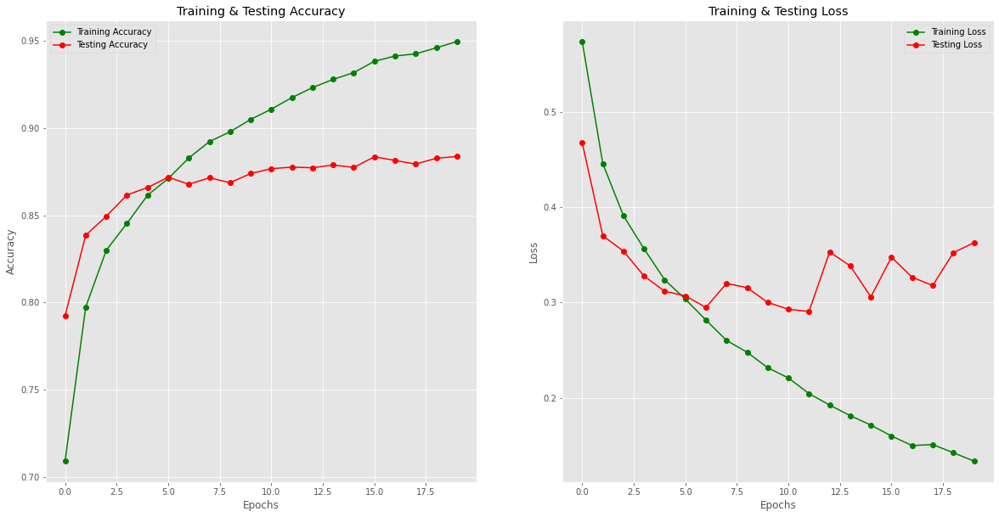

In [204]:
epochs = [i for i in range(20)]
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
fig.set_size_inches(20,10)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Testing Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'go-' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'ro-' , label = 'Testing Loss')
ax[1].set_title('Training & Testing Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

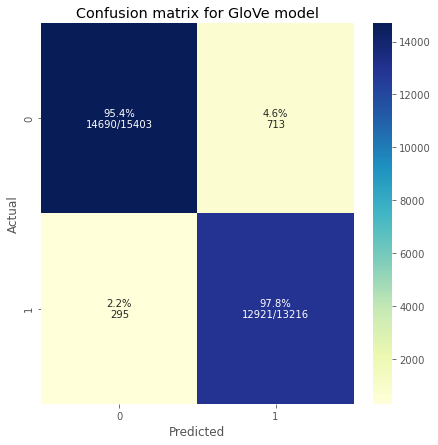

In [205]:
train_pred_GloVe = model.predict(train_glove)
train_pred_GloVe_int = train_pred_GloVe.round().astype('int')
plot_cm(train_pred_GloVe_int, df5['is_sarcastic'].values, 'Confusion matrix for GloVe model', figsize=(7,7))

In [206]:
print(classification_report(df5['is_sarcastic'].values, train_pred_GloVe_int))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97     14985
           1       0.98      0.95      0.96     13634

    accuracy                           0.96     28619
   macro avg       0.97      0.96      0.96     28619
weighted avg       0.97      0.96      0.96     28619



### We also get a better result compare with other kaggle users with data2 but with little of data, we manage to get overfitting data while combine two datas is unlikely to overfit